In [1]:
import os
import subprocess
import time
import glob
import numpy as np
import cv2
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap as lsc
import torch
import h5py

import itertools
import numpy as np
from numpy import linalg as LA
import matplotlib.pyplot as plt

from deeplsd.utils.tensor import batch_to_device
from deeplsd.models.deeplsd_inference import DeepLSD
from deeplsd.geometry.viz_2d import plot_images, plot_lines

# Import the Deeplsd model

In [2]:
# Model config
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
conf = {
    'detect_lines': True,  
    'line_detection_params': {
        'merge': False,  
        'filtering': True,  
        'grad_thresh': 3,
        'grad_nfa': True, 
    }
}

# Load the model
ckpt = '../weights/deeplsd_md.tar'
ckpt = torch.load(str(ckpt), map_location='cpu', weights_only=False)
net = DeepLSD(conf)
net.load_state_dict(ckpt['model'])
net = net.to(device).eval()

# Import the desired data (Hypersim images)

In [3]:
#Parameters

frame_str = "0001"

# images
desired_images = [
    "ai_001_001",
    "ai_001_003",
    "ai_001_004",
    "ai_001_005",
    "ai_001_006",
    "ai_001_007",
    "ai_001_008",
    "ai_001_009",
    "ai_002_001",
    "ai_002_003",
    "ai_002_004",
    "ai_002_005",
    "ai_002_006",
    
]


files_to_download = [
    f"frame.{frame_str}.color.jpg",
    f"frame.{frame_str}.depth_meters.hdf5",
    f"frame.{frame_str}.normal_world.hdf5",
    f"frame.{frame_str}.normal_bump_world.hdf5",
    f"frame.{frame_str}.position.hdf5"
]

In [4]:

base_data_dir = "data"
if not os.path.exists(base_data_dir):
    os.makedirs(base_data_dir)
    print(f"Created base data folder: {base_data_dir}")
else:
    print(f"Base data folder {base_data_dir} already exists.")
    

Created base data folder: data


In [5]:

# Download Loop
for image_id in desired_images:
    # Create a folder for the image
    image_dir = os.path.join(base_data_dir, image_id)
    if not os.path.exists(image_dir):
        os.makedirs(image_dir)
        print(f"Created folder: {image_dir}")
    else:
        print(f"Folder {image_dir} already exists.")

    # Try to download all the required files.
    for file_name in files_to_download:
        # Check if the file already exists.
        matching_files = glob.glob(os.path.join(image_dir, "**", file_name), recursive=True)
        if matching_files:
            print(f"File {file_name} already exists in {image_dir} (found: {matching_files[0]}). Skipping download.")
            continue

        # Build the command for download.py.
        cmd = [
            "python", "download.py",
            "--contains", image_id,
            "--contains", file_name,
            "--directory", image_dir,
            "--silent"
        ]
        print(f"Downloading {file_name} for {image_id} ...")
        proc = subprocess.Popen(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE,
                                text=True, stdin=subprocess.DEVNULL)

        # Poll for file existence and stability.
        timeout = 1000  # seconds
        stable_iterations = 2  # number of consecutive checks required for stability
        stable_count = 0
        prev_size = -1
        start_time = time.time()
        while True:
            matching_files = glob.glob(os.path.join(image_dir, "**", file_name), recursive=True)
            if matching_files:
                # Check the file size of the first match.
                file_path = matching_files[0]
                try:
                    current_size = os.path.getsize(file_path)
                except OSError:
                    current_size = 0

                # If the file size is non-zero and hasn't changed since last check:
                if current_size > 0 and current_size == prev_size:
                    stable_count += 1
                else:
                    stable_count = 0  # Reset if it changed or if it's still zero

                prev_size = current_size

                if stable_count >= stable_iterations:
                    print(f"File {file_name} appears fully downloaded (stable size: {current_size} bytes). Terminating process.")
                    proc.terminate()  # terminate the download process if file is stable
                    break
            else:
                # No file found yet: reset stable count.
                stable_count = 0
                prev_size = -1

            if time.time() - start_time > timeout:
                print(f"Timeout reached while waiting for {file_name} in {image_dir}. Killing process.")
                proc.kill()
                break
            time.sleep(1)

        # Capture any remaining output.
        try:
            stdout, stderr = proc.communicate(timeout=5)
        except subprocess.TimeoutExpired:
            proc.kill()
            stdout, stderr = proc.communicate()

        if proc.returncode not in [0, None]:
            print(f"Process for {file_name} in {image_id} exited with return code {proc.returncode}.")


Created folder: data/ai_001_001
File frame.0001.color.jpg appears fully downloaded (stable size: 201550 bytes). Terminating process.
Process for frame.0001.color.jpg in ai_001_001 exited with return code -15.
File frame.0001.depth_meters.hdf5 appears fully downloaded (stable size: 194504 bytes). Terminating process.
Process for frame.0001.depth_meters.hdf5 in ai_001_001 exited with return code -15.
File frame.0001.normal_world.hdf5 appears fully downloaded (stable size: 681300 bytes). Terminating process.
Process for frame.0001.normal_world.hdf5 in ai_001_001 exited with return code -15.
File frame.0001.normal_bump_world.hdf5 appears fully downloaded (stable size: 2304541 bytes). Terminating process.
Process for frame.0001.normal_bump_world.hdf5 in ai_001_001 exited with return code -15.
File frame.0001.position.hdf5 appears fully downloaded (stable size: 1109878 bytes). Terminating process.
Process for frame.0001.position.hdf5 in ai_001_001 exited with return code -15.
Created folder:

# Define Helper Functions

In [20]:
import os

import cv2
import h5py
import numpy as np
import pyvista as pv


def to_homogeneous(arr):
    # Adds a new column with ones
    return np.hstack([arr, np.ones((len(arr), 1))])


def to_homogeneous_t(arr):
    # Adds a new row with ones
    return np.vstack([arr, np.ones((1, arr.shape[1]))])


def to_cartesian(arr):
    return arr[..., :-1] / arr[..., -1].reshape((-1,) + (1,) * (arr.ndim - 1))


def to_cartesian_t(arr):
    return arr[:-1] / arr[-1]


def read_image(imname, resize_hw=None, max_image_dim=None, set_gray=False):
    img = cv2.imread(imname)
    if resize_hw is not None:
        img = cv2.resize(img, (resize_hw[1], resize_hw[0]))
    if (max_image_dim is not None) and max_image_dim != -1:
        hw_now = img.shape[:2]
        ratio = max_image_dim / max(hw_now[0], hw_now[1])
        if ratio < 1.0:
            h_new = int(round(hw_now[0] * ratio))
            w_new = int(round(hw_now[1] * ratio))
            img = cv2.resize(img, (w_new, h_new))
    if set_gray:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    return img


def read_raydepth(raydepth_fname, resize_hw=None, max_image_dim=None):
    with h5py.File(raydepth_fname, "r") as f:
        raydepth = np.array(f["dataset"]).astype(np.float32)
    if resize_hw is not None and raydepth.shape != resize_hw:
        raydepth = cv2.resize(raydepth, (resize_hw[1], resize_hw[0]))
    if (max_image_dim is not None) and max_image_dim != -1:
        hw_now = raydepth.shape[:2]
        ratio = max_image_dim / max(hw_now[0], hw_now[1])
        if ratio < 1.0:
            h_new = int(round(hw_now[0] * ratio))
            w_new = int(round(hw_now[1] * ratio))
            raydepth = cv2.resize(raydepth, (w_new, h_new))
    return raydepth


def raydepth2depth(raydepth, K):
    K_inv = np.linalg.inv(K)
    h, w = raydepth.shape[0], raydepth.shape[1]
    grids = np.meshgrid(np.arange(w), np.arange(h))
    coords_homo = [grids[0].reshape(-1), grids[1].reshape(-1), np.ones(h * w)]
    coords_homo = np.stack(coords_homo)
    coeffs = np.linalg.norm(K_inv @ coords_homo, axis=0)
    coeffs = coeffs.reshape(h, w)
    depth = raydepth / coeffs
    return depth


class Hypersim:
    # constants
    default_h, default_w = 768, 1024
    h, w = default_h, default_w
    # fov_x = 60 * np.pi / 180
    # set fov_x to pi/3 to match DIODE dataset (60 degrees)
    fov_x = np.pi / 3  # set fov_x to pi/3 to match DIODE dataset (60 degrees)
    f = w / (2 * np.tan(fov_x / 2))
    fov_y = 2 * np.arctan(h / (2 * f))
    default_K = np.array([[f, 0, w / 2], [0, f, h / 2], [0, 0, 1]])
    K = default_K
    R180x = np.array([[1, 0, 0], [0, -1, 0], [0, 0, -1]])

    def __init__(self, data_dir):
        self.data_dir = data_dir

        # scene to load
        self.scene_dir = None
        # meters per asset unit, initialized when set_scene_id is called
        self.mpau = None
        self.cam_id = -1
        self.Tvecs, self.Rvecs = None, None

    @classmethod
    def set_max_dim(cls, max_dim):
        ratio = max_dim / max(cls.h, cls.w)
        if ratio < 1.0:
            cls.set_resize_ratio(ratio)

    @classmethod
    def set_resize_ratio(cls, ratio):
        cls.h, cls.w = (
            int(round(cls.default_h * ratio)),
            int(round(cls.default_w * ratio)),
        )
        cls.K[0, :] = cls.default_K[0, :] * cls.w / cls.default_w
        cls.K[1, :] = cls.default_K[1, :] * cls.h / cls.default_h

    def read_mpau(self, scene_dir):
        fname_metascene = os.path.join(
            scene_dir, "_detail", "metadata_scene.csv"
        )
        import csv

        param_dict = {}
        with open(fname_metascene) as f:
            reader = csv.DictReader(f)
            for row in reader:
                param_dict[row["parameter_name"]] = row["parameter_value"]
        key = "meters_per_asset_unit"
        if key in param_dict:
            return float(param_dict[key])
        else:
            raise ValueError(f"Key {key} not exists in {fname_metascene}")

    def set_scene_id(self, scene_id):
        self.scene_dir = os.path.join(self.data_dir, scene_id)
        self.mpau = self.read_mpau(self.scene_dir)

    def filter_index_list(self, index_list, cam_id=0):
        new_index_list = []
        for image_id in index_list:
            image_fname = os.path.join(
                self.scene_dir,
                "images",
                f"scene_cam_{cam_id:02d}_final_preview",
                f"frame.{image_id:04d}.color.jpg",
            )
            if os.path.exists(image_fname):
                new_index_list.append(image_id)
        return new_index_list

    def load_cameras(self, cam_id=0, scene_id=None):
        if scene_id is not None:
            self.set_scene_id(scene_id)
        if self.cam_id == cam_id:
            return self.Tvecs, self.Rvecs
        self.cam_id = cam_id
        scene_dir = self.scene_dir

        positions_fname = os.path.join(
            scene_dir,
            "_detail",
            f"cam_{cam_id:02d}",
            "camera_keyframe_positions.hdf5",
        )
        with h5py.File(positions_fname, "r") as f:
            self.Tvecs = np.array(f["dataset"]).astype(np.float32)

        orientations_fname = os.path.join(
            scene_dir,
            "_detail",
            f"cam_{cam_id:02d}",
            "camera_keyframe_orientations.hdf5",
        )
        with h5py.File(orientations_fname, "r") as f:
            self.Rvecs = np.array(f["dataset"]).astype(np.float32)

        # change to world-frame R and t following Iago Suarez
        # [LINK] https://github.com/iago-suarez/powerful-lines/blob/main/src/evaluation/consensus_3dsegs_detection.py
        N_images = self.Tvecs.shape[0]
        for image_id in range(N_images):
            self.Rvecs[image_id] = self.R180x @ self.Rvecs[image_id].T
            self.Tvecs[image_id] = self.Tvecs[image_id] * self.mpau
            self.Tvecs[image_id] = -self.Rvecs[image_id] @ self.Tvecs[image_id]
        return self.Tvecs, self.Rvecs

    def load_imname(self, image_id, cam_id=0, scene_id=None):
        if scene_id is not None:
            self.set_scene_id(scene_id)
        scene_dir = self.scene_dir
        image_fname = os.path.join(
            scene_dir,
            "images",
            f"scene_cam_{cam_id:02d}_final_preview",
            f"frame.{image_id:04d}.color.jpg",
        )
        return image_fname

    def load_image(self, image_id, set_gray=True, cam_id=0, scene_id=None):
        image_fname = self.load_imname(
            image_id, cam_id=cam_id, scene_id=scene_id
        )
        img = read_image(
            image_fname, resize_hw=(self.h, self.w), set_gray=set_gray
        )
        return img

    def load_raydepth_fname(self, image_id, cam_id=0, scene_id=None):
        if scene_id is not None:
            self.set_scene_id(scene_id)
        scene_dir = self.scene_dir
        raydepth_fname = os.path.join(
            scene_dir,
            "images",
            f"scene_cam_{cam_id:02d}_geometry_hdf5",
            f"frame.{image_id:04d}.depth_meters.hdf5",
        )
        return raydepth_fname

    def load_raydepth(self, image_id, cam_id=0, scene_id=None):
        raydepth_fname = self.load_raydepth_fname(
            image_id, cam_id=cam_id, scene_id=scene_id
        )
        raydepth = read_raydepth(raydepth_fname, resize_hw=(self.h, self.w))
        return raydepth

    def load_depth(self, image_id, cam_id=0, scene_id=None):
        raydepth_fname = self.load_raydepth_fname(
            image_id, cam_id=cam_id, scene_id=scene_id
        )
        raydepth = read_raydepth(raydepth_fname, resize_hw=(self.h, self.w))
        depth = raydepth2depth(raydepth, self.K, (self.h, self.w))
        return depth

    def get_point_cloud(self, img_id, cam_id=0, scene_id=None):
        depth = self.load_depth(img_id, cam_id=cam_id, scene_id=scene_id)
        K, R, T = self.K, self.Rvecs[img_id], self.Tvecs[img_id]
        xv, yv = np.meshgrid(np.arange(self.w), np.arange(self.h))
        homo_2d = to_homogeneous_t(np.array([xv.flatten(), yv.flatten()]))
        points = np.linalg.inv(K) @ (homo_2d * depth.flatten())
        points = R.T @ (points - T[:, None])
        return points.T

    def get_point_cloud_from_list(self, img_id_list, cam_id=0, scene_id=None):
        all_points = []
        for img_id in img_id_list:
            points = self.get_point_cloud(img_id, cam_id=0, scene_id=None)
            all_points.append(points)
        all_points = np.concatenate(all_points, 0)
        return all_points

    @classmethod
    def set_camera_properties(cls, cam, Rt):
        h, w = cls.h, cls.w
        cam.view_frustum(w / h)
        cam.SetViewAngle(cls.fov_y * 180 / np.pi)
        cam.SetViewUp(0.0, -1.0, 0.0)
        cam.SetPosition(0, 0, 0)
        cam.SetFocalPoint(0.0, 0.0, 2.0)
        cam.clipping_range = (0.001, 100)
        cam.SetModelTransformMatrix(Rt.ravel())

    @classmethod
    def get_camera_frustrum(cls, Rt):
        h, w = cls.h, cls.w
        view_camera = pv.Camera()
        Hypersim.set_camera_properties(view_camera, Rt)
        view_camera.clipping_range = (1e-5, 0.5)
        frustum = view_camera.view_frustum(w / h)
        return frustum

In [ ]:
import os
import glob
import cv2
import h5py

def find_file(image_dir, image_id,  pattern, cam_view):

    search_pattern = os.path.join(image_dir, image_id, "images", cam_view, pattern)
    print(search_pattern)
    files = glob.glob(search_pattern, recursive=True)
    return files[0] if files else None

def load_color_image(image_dir, image_id,  frame_str, cam_view):

    color_file = find_file(image_dir, image_id,  f"frame.{frame_str}.color.jpg", cam_view)
    if color_file is None:
        print("Color image not found in", image_dir, "with camera view", cam_view)
        return None
    img = cv2.imread(color_file)
    if img is None:
        print("Failed to load", color_file)
        return None
    # Convert from BGR to RGB
    return cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

def load_depth_map(image_dir, image_id, frame_str, cam_view):

    depth_file = find_file(image_dir,  image_id, f"frame.{frame_str}.depth_meters.hdf5", cam_view)
    if depth_file is None:
        print("Depth file not found in", image_dir, "with camera view", cam_view)
        return None
    with h5py.File(depth_file, 'r') as f:
        depth = np.array(f['dataset'])
    return depth.astype(np.float32)

def load_normal_map(image_dir,  image_id, frame_str, cam_view):

    normal_file = find_file(image_dir, image_id,  f"frame.{frame_str}.normal_world.hdf5", cam_view)
    if normal_file is None:
        print("Normal file not found in", image_dir, "with camera view", cam_view)
        return None
    with h5py.File(normal_file, 'r') as f:
        normal = np.array(f['dataset'])
    return normal.astype(np.float32)


def compute_variation(mapping, k):
    """
    Computes the Sobel variation of a mapping (depth or normal) using a kernel size k.
    Normalizes the result by subtracting the mean and dividing by the standard deviation.
    """
    grad_x = cv2.Sobel(mapping, cv2.CV_64F, 1, 0, ksize=k)
    grad_y = cv2.Sobel(mapping, cv2.CV_64F, 0, 1, ksize=k)
    variation = np.sqrt(grad_x**2 + grad_y**2)
    mean = np.mean(variation)
    std_dev = np.std(variation)
    normalized = (variation - mean) / std_dev
    return normalized

def sobel_line(sobel_depth, sobel_normal, line):
    """
    Returns the sobel values along that line for both depth and normal.
    """
    x1, y1 = int(round(line[0, 0])), int(round(line[0, 1]))
    x2, y2 = int(round(line[1, 0])), int(round(line[1, 1]))
    mask_depth = cv2.line(np.zeros_like(sobel_depth), (x1, y1), (x2, y2), 1, 1)
    mask_normal = cv2.line(np.zeros_like(sobel_normal), (x1, y1), (x2, y2), 1, 1)
    return mask_depth * sobel_depth, mask_normal * sobel_normal

def overlay_lines_on_image(image, lines, is_struct):
    """
    Overlays predicted lines on the image.
    """
    overlay = image.copy()
    for i, line in enumerate(lines):
        x1, y1 = int(round(line[0, 0])), int(round(line[0, 1]))
        x2, y2 = int(round(line[1, 0])), int(round(line[1, 1]))
        # In RGB: blue for structural, red for textural.
        color = (0, 0, 255) if is_struct[i] else (255, 0, 0)
        cv2.line(overlay, (x1, y1), (x2, y2), color, thickness=2)
    return overlay



# ===== Extension: Structural Line Classification Using Neighborhood Variation =====

def sobel_line_neighborhood(sobel_depth, sobel_normal, line, thickness=5):
    """
    """
    x1, y1 = int(round(line[0, 0])), int(round(line[0, 1]))
    x2, y2 = int(round(line[1, 0])), int(round(line[1, 1]))
    # Draw a thicker line mask to capture the neighborhood.
    mask_depth = cv2.line(np.zeros_like(sobel_depth), (x1, y1), (x2, y2), 1, thickness=thickness)
    mask_normal = cv2.line(np.zeros_like(sobel_normal), (x1, y1), (x2, y2), 1, thickness=thickness)
    return mask_depth * sobel_depth, mask_normal * sobel_normal

def overlay_lines_on_image_custom(image, lines, is_struct, line_color_struct, line_color_text):
    """
    Overlays predicted lines on the image using custom colors.
    """
    overlay = image.copy()
    for i, line in enumerate(lines):
        x1, y1 = int(round(line[0, 0])), int(round(line[0, 1]))
        x2, y2 = int(round(line[1, 0])), int(round(line[1, 1]))
        color = line_color_struct if is_struct[i] else line_color_text
        cv2.line(overlay, (x1, y1), (x2, y2), color, thickness=2)
    return overlay



def process_image(image_dir, image_id, frame_str, net, device,
                  depth_thresh, normal_thresh, thickness,
                  method="neighborhood", depth_normal_func = np.max,
                  depth_normal_func_str = "Max", norm_agg_func=np.sum,
                  struct_color=(0, 0, 255), text_color=(255, 0, 0),
                  display_result=True, plot_metrics=False):
    """
    Process a single image folder.

    Parameters:
      image_dir (str): Path to the image folder.
      frame_str (str): Frame number (e.g., "0001").
      net: The DeepLSD model.
      device: Torch device.
      depth_thresh (float): Threshold for depth variation.
      normal_thresh (float): Threshold for normal variation.
      thickness (int): Thickness (for neighborhood method).
      method (str): 'neighborhood' or 'original'. Determines which classification method to use.
      struct_color (tuple): Color for structural lines (default blue).
      text_color (tuple): Color for textural lines (default red).
      display_result (bool): If True, displays the composite image.
      plot_metrics (bool): If True, plots the max variation metrics for each detected line.

    Returns:
      composite (np.array): The composite image with overlaid lines, or None if data is missing.
    """
    # Load the image data
    cam_view_color = "scene_cam_00_final_preview"
    cam_view_geom = "scene_cam_00_geometry_hdf5"

    #hypersim = Hypersim("/data")

    color_img = load_color_image(image_dir, image_id, frame_str, cam_view_color)
    
    h, w = color_img.shape[:2]
    fov_x = np.pi / 3  # set fov_x to pi/3 to match DIODE dataset (60 degrees)
    f = w / (2 * np.tan(fov_x / 2))
    fov_y = 2 * np.arctan(h / (2 * f))
    default_K = np.array([[f, 0, w / 2], [0, f, h / 2], [0, 0, 1]])
    R180x = np.array([[1, 0, 0], [0, -1, 0], [0, 0, -1]])


    depth_map = load_depth_map(image_dir, image_id, frame_str, cam_view_geom)
    depth_map = raydepth2depth(depth_map, default_K)
    normal_map = load_normal_map(image_dir, image_id, frame_str, cam_view_geom)
    
    if color_img is None or depth_map is None or normal_map is None:
        print(f"Missing data in {image_dir}; skipping processing.")
        return None

    gray_img = cv2.cvtColor(color_img, cv2.COLOR_RGB2GRAY)


    
    # Detect lines with DeepLSD.
    input_tensor = torch.tensor(gray_img, dtype=torch.float32, device=device)[None, None] / 255.
    with torch.no_grad():
        out = net({'image': input_tensor})
        pred_lines = out['lines'][0]
        if isinstance(pred_lines, torch.Tensor):
            pred_lines = pred_lines.cpu().numpy()
    
    
    
    # Compute Sobel variation maps for depth and normal.
    sobel_depth_map = compute_variation(depth_map, 11)
    sobel_normal_map = compute_variation(normal_map, 27)
    
    sobel_normal_map = norm_agg_func(sobel_normal_map, axis=2)

    plot_images([sobel_depth_map], ["Depth sobel"], cmaps='gray')
    plot_images([(sobel_normal_map)], ['Normal sobel'], cmaps='gray')




        
        
    # Classify each predicted line and collect max metrics.
    is_struct = []
    depth_max_vals = []  # List to store max depth variation per line.
    normal_max_vals = []  # List to store max normal variation per line.
    
    if method == "neighborhood":
        # Use the neighborhood-based method.
        for l in pred_lines:
            ld_neigh, ln_neigh = sobel_line_neighborhood(sobel_depth_map, sobel_normal_map, l, thickness=thickness)
            max_depth = depth_normal_func(ld_neigh)
            max_normal = depth_normal_func(ln_neigh)
            depth_max_vals.append(max_depth)
            normal_max_vals.append(max_normal)
            depth_bool = max_depth > depth_thresh
            normal_bool = max_normal > normal_thresh
            is_struct.append(depth_bool or normal_bool)
    else:
        # Use the original line-based method.
        for l in pred_lines:
            ld_line, ln_line = sobel_line(sobel_depth_map, sobel_normal_map, l)
            max_depth = depth_normal_func(ld_line)
            max_normal = depth_normal_func(ln_line)
            depth_max_vals.append(max_depth)
            normal_max_vals.append(max_normal)
            depth_bool = max_depth > depth_thresh
            normal_bool = max_normal > normal_thresh
            is_struct.append(depth_bool or normal_bool)

    print(f"[{method.capitalize()} Method] {os.path.basename(image_dir)}: Detected {len(pred_lines)} lines; {sum(is_struct)} classified as structural.")

    
    
    # Create a composite image using custom overlay (with custom colors).
    composite = overlay_lines_on_image_custom(color_img, pred_lines, is_struct,
                                               line_color_struct=struct_color,
                                               line_color_text=text_color)
    
    
    
    # Optionally display the composite image.
    if display_result:
        plt.figure(figsize=(10, 10))
        plt.imshow(composite)
        plt.title(f"{os.path.basename(image_dir)} - Frame {frame_str}: Structural vs Textural")
        plt.axis("off")
        plt.show()
    
    
    
    # Optionally, plot the max variation metrics.
    if plot_metrics and len(depth_max_vals) > 0:
        plt.figure(figsize=(8, 6))
        # Plot structural lines in one color and textural in another.
        for i in range(len(depth_max_vals)):
            if is_struct[i]:
                plt.scatter(depth_max_vals[i], normal_max_vals[i], c='blue', marker='o', label='Structural' if i==0 else "")
            else:
                plt.scatter(depth_max_vals[i], normal_max_vals[i], c='red', marker='x', label='Textural' if i==0 else "")
        plt.xlabel(f"{depth_normal_func_str} Depth Variation")
        plt.ylabel(f"{depth_normal_func_str} Normal Variation")
        plt.title(f"{os.path.basename(image_dir)} - Frame {frame_str} - Thickness {thickness}: Variation Metrics")
        plt.legend()
        plt.grid(True)
        plt.show()
    
    return composite




In [32]:
def plot_process(image_ids, base_data_dir, depth_thresholds, normal_thresholds,
                thickness_values, n_columns=2, depth_normal_func=np.max, depth_normal_func_str="Max",
                norm_agg_func=np.sum):
    
    for image_id in image_ids:
        image_dir = os.path.join(base_data_dir, image_id)
        print(f"\n[Parameter Comparison] Processing image: {image_id} for frame {frame_str}")

        # Lists to store the composite images and their corresponding titles
        composite_images = []
        titles = []
        plot = True # Only plot the first time
        # Iterate over the Cartesian product of all parameter arrays
        for d_thresh, n_thresh, t_val in itertools.product(depth_thresholds, normal_thresholds, thickness_values):
            # Process the image with the current set of parameters

            composite = process_image(
                image_dir, image_id, frame_str, net, device,
                depth_thresh=d_thresh,
                normal_thresh=n_thresh,
                thickness=t_val,
                method="neighborhood",
                depth_normal_func=depth_normal_func,
                depth_normal_func_str=depth_normal_func_str,
                norm_agg_func=norm_agg_func,
                struct_color=(0, 0, 255),  # blue
                text_color=(255, 0, 0),    # red
                display_result=False,
                plot_metrics=plot
            )
            plot=False # no need to plot more than once

            if composite is not None:
                composite_images.append(composite)
                titles.append(f"d={d_thresh}, n={n_thresh}, t={t_val}")

        # If we got any composite images, create a grid for comparison
        n_composites = len(composite_images)
        if n_composites > 0:
            # Define the grid with 2 columns
            n_cols = n_columns
            n_rows = int(np.ceil(n_composites / n_cols))
            fig, axs = plt.subplots(n_rows, n_cols, figsize=(n_cols*5, n_rows*5))
            # Flatten the axes array in case it is multidimensional.
            axs = np.array(axs).flatten()
            for i, comp in enumerate(composite_images):
                axs[i].imshow(comp)
                axs[i].set_title(titles[i])
                axs[i].axis("off")
            # Hide any unused subplots.
            for j in range(n_composites, len(axs)):
                axs[j].axis("off")
            plt.suptitle(f"{image_id} - Frame {frame_str} Parameter Comparison", fontsize=16)
            plt.tight_layout()
            plt.show()

            # save the grid of composite images.
            grid_out_path = os.path.join(image_dir, f"parameter_comparison_{frame_str}.png")
            fig.savefig(grid_out_path)
            print(f"Saved parameter comparison grid to {grid_out_path}")

# Process all images

# First method


Processing image: ai_001_001 for frame 0001
data/ai_001_001/ai_001_001/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_001/ai_001_001/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_001/ai_001_001/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
Detected 398 lines; 131 classified as structural.
Saved composite image with structural/textural lines to data/ai_001_001/composite_lines_0001.png


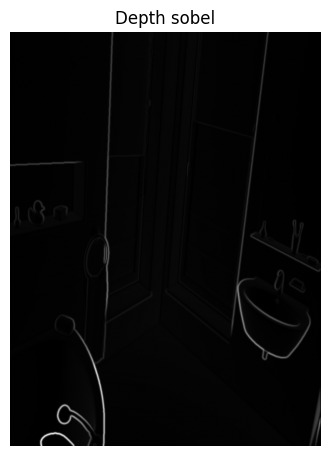

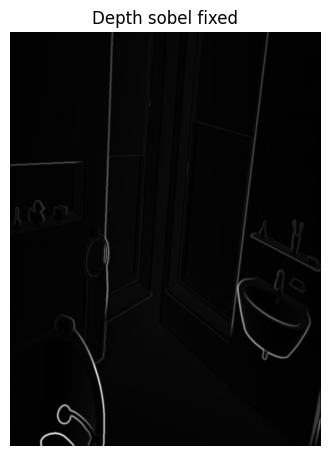

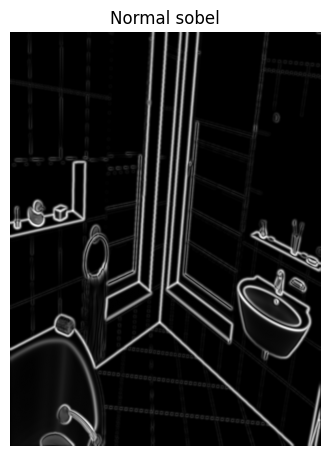

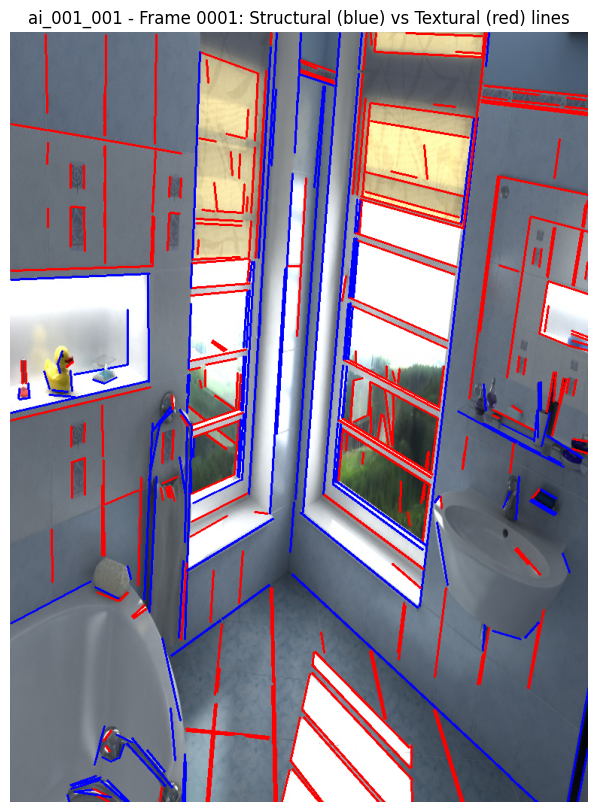


Processing image: ai_001_003 for frame 0001
data/ai_001_003/ai_001_003/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_003/ai_001_003/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_003/ai_001_003/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
Detected 347 lines; 0 classified as structural.
Saved composite image with structural/textural lines to data/ai_001_003/composite_lines_0001.png


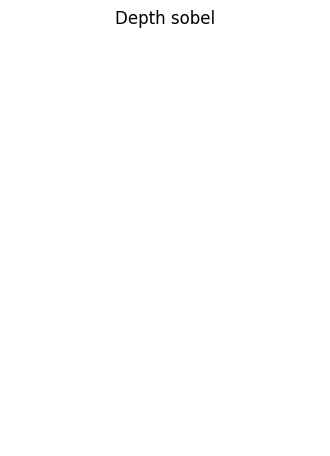

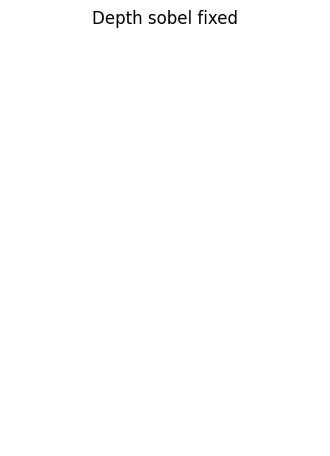

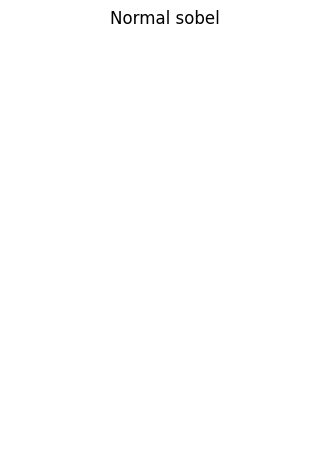

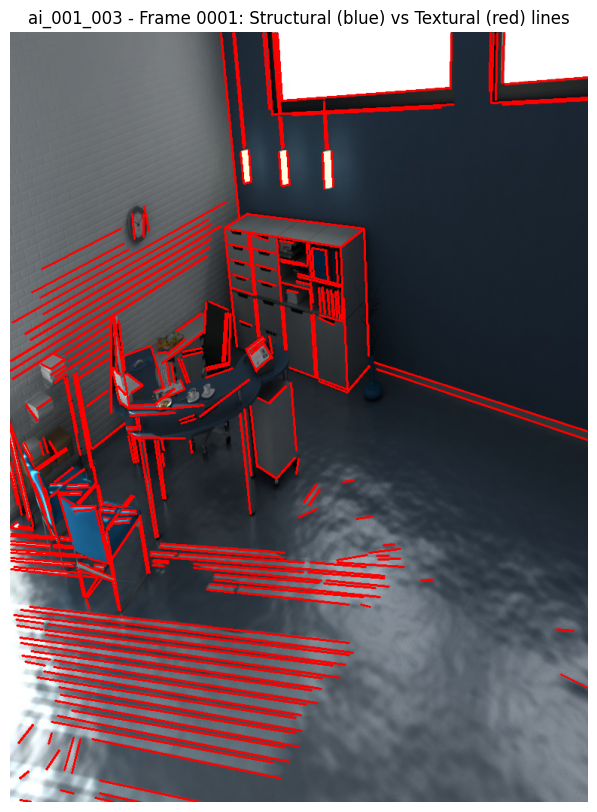


Processing image: ai_001_004 for frame 0001
data/ai_001_004/ai_001_004/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_004/ai_001_004/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_004/ai_001_004/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
Detected 360 lines; 163 classified as structural.
Saved composite image with structural/textural lines to data/ai_001_004/composite_lines_0001.png


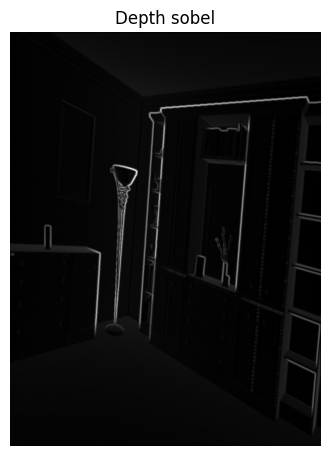

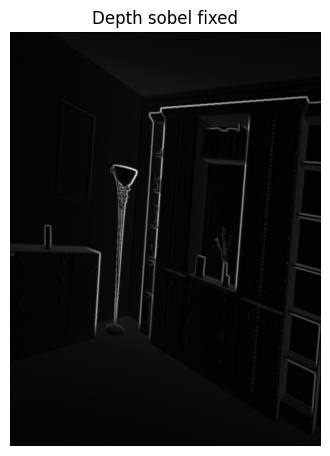

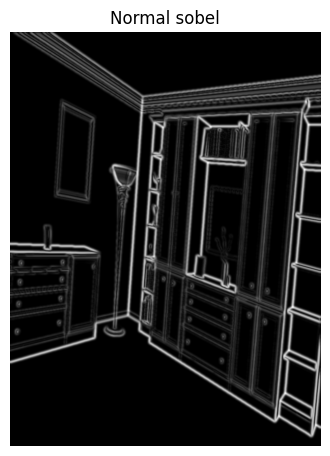

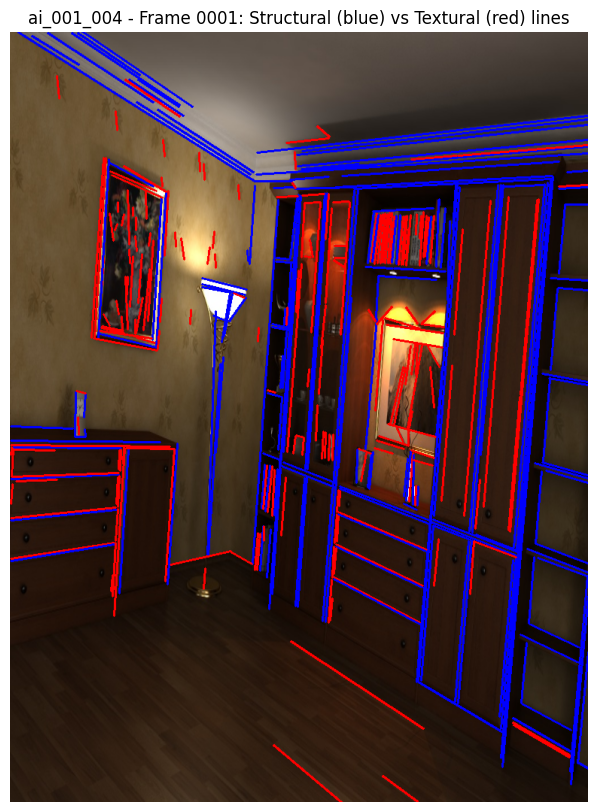


Processing image: ai_001_005 for frame 0001
data/ai_001_005/ai_001_005/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_005/ai_001_005/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_005/ai_001_005/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
Detected 477 lines; 237 classified as structural.
Saved composite image with structural/textural lines to data/ai_001_005/composite_lines_0001.png


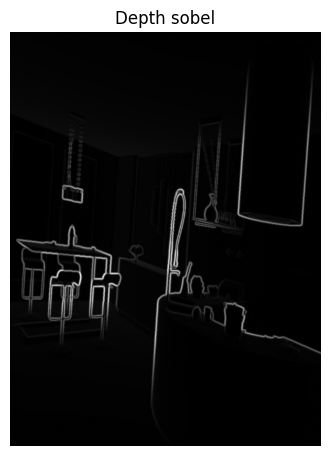

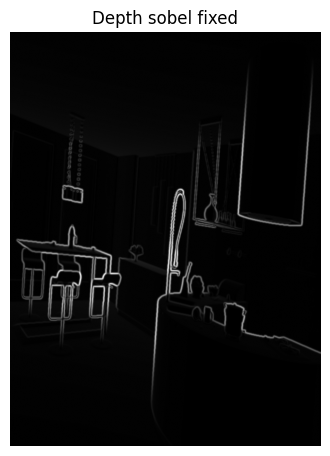

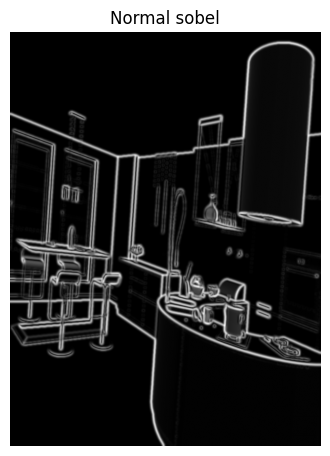

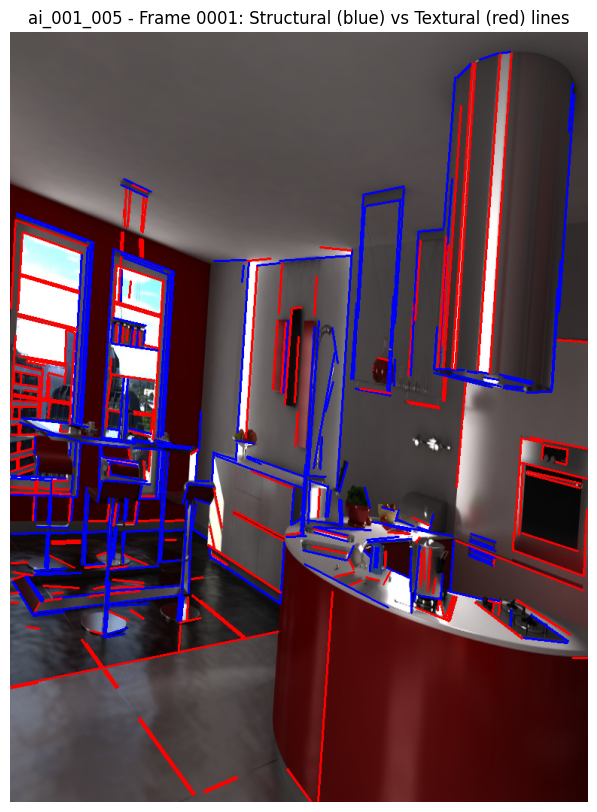


Processing image: ai_001_006 for frame 0001
data/ai_001_006/ai_001_006/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_006/ai_001_006/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_006/ai_001_006/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
Detected 521 lines; 97 classified as structural.
Saved composite image with structural/textural lines to data/ai_001_006/composite_lines_0001.png


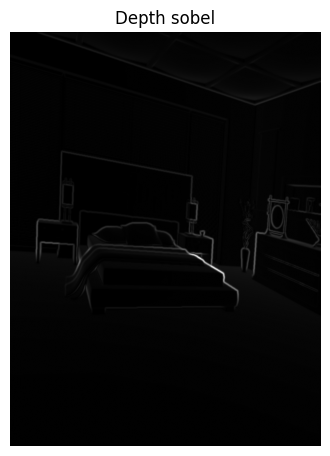

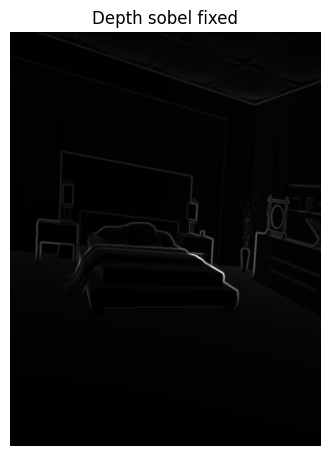

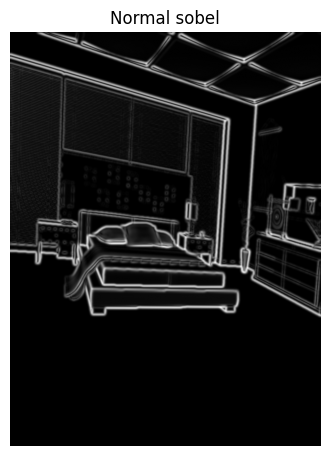

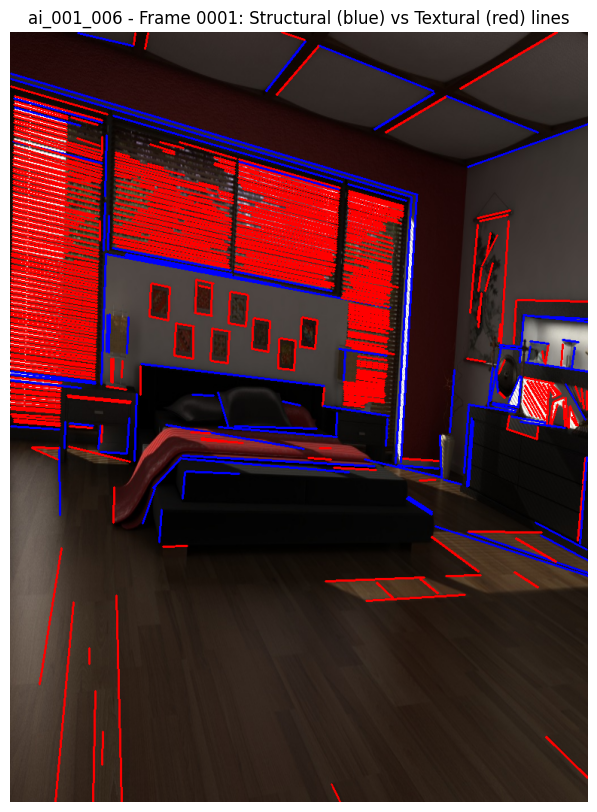


Processing image: ai_001_007 for frame 0001
data/ai_001_007/ai_001_007/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_007/ai_001_007/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_007/ai_001_007/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
Detected 542 lines; 202 classified as structural.
Saved composite image with structural/textural lines to data/ai_001_007/composite_lines_0001.png


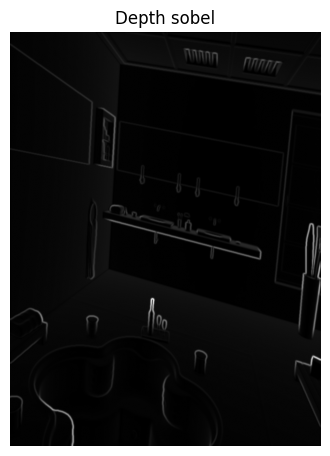

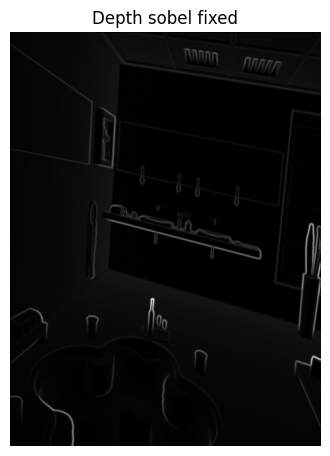

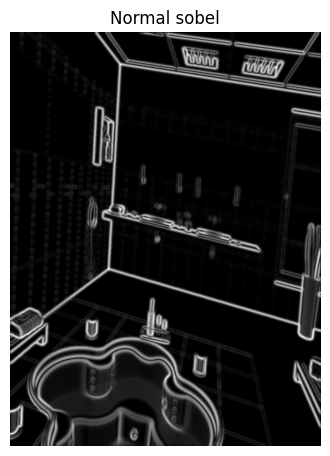

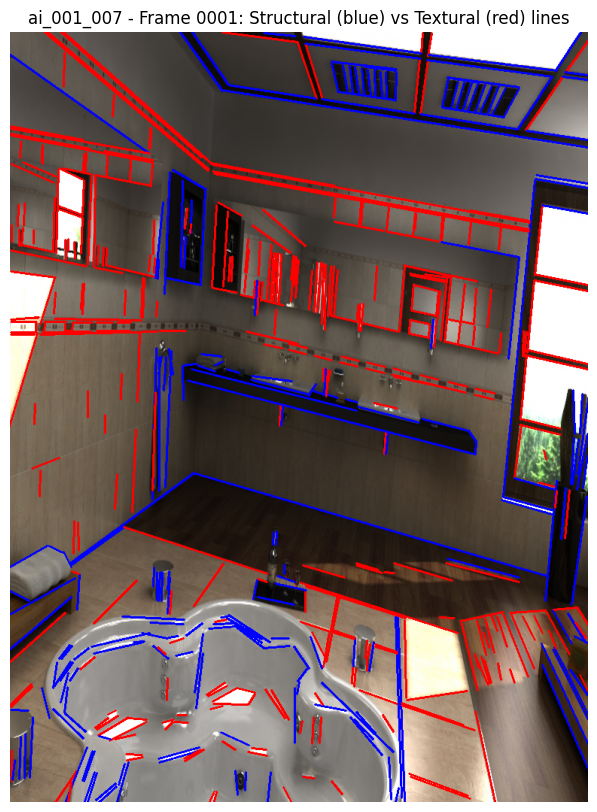


Processing image: ai_001_008 for frame 0001
data/ai_001_008/ai_001_008/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_008/ai_001_008/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_008/ai_001_008/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
Detected 468 lines; 117 classified as structural.
Saved composite image with structural/textural lines to data/ai_001_008/composite_lines_0001.png


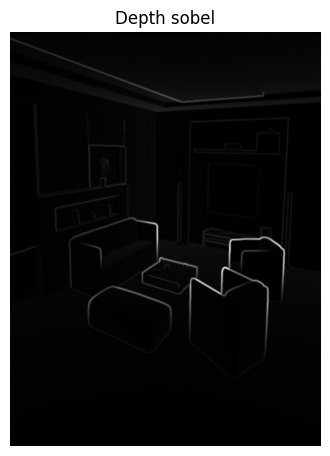

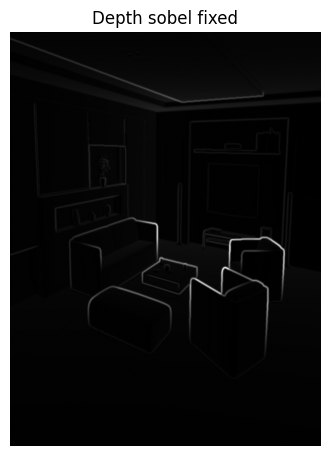

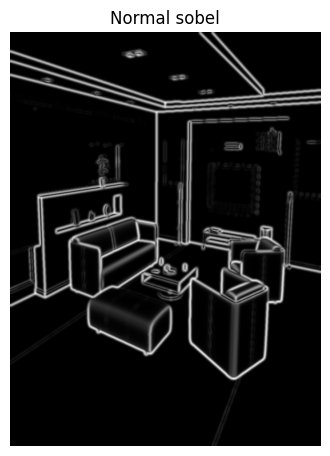

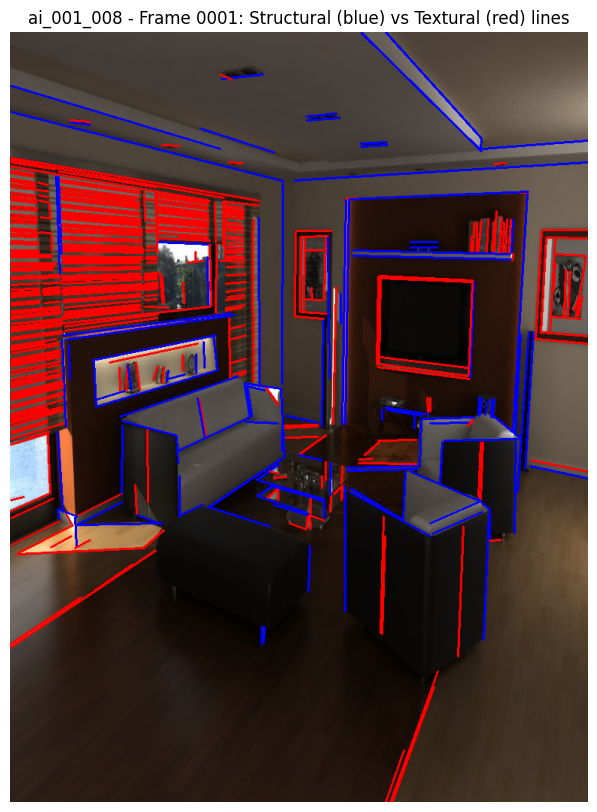


Processing image: ai_001_009 for frame 0001
data/ai_001_009/ai_001_009/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_009/ai_001_009/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_009/ai_001_009/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
Detected 218 lines; 90 classified as structural.
Saved composite image with structural/textural lines to data/ai_001_009/composite_lines_0001.png


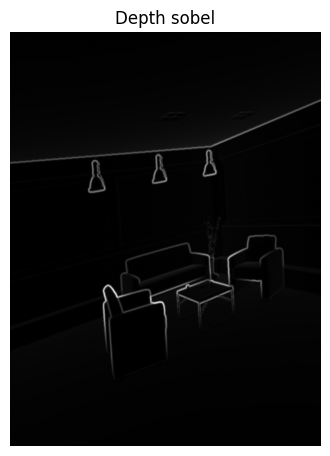

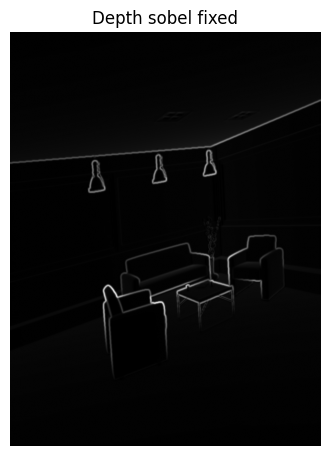

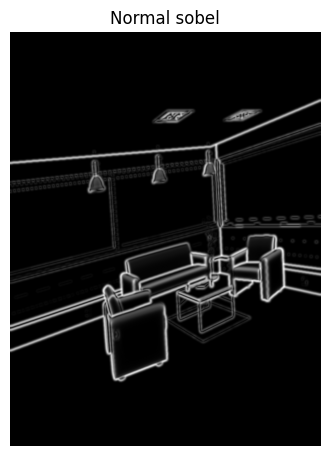

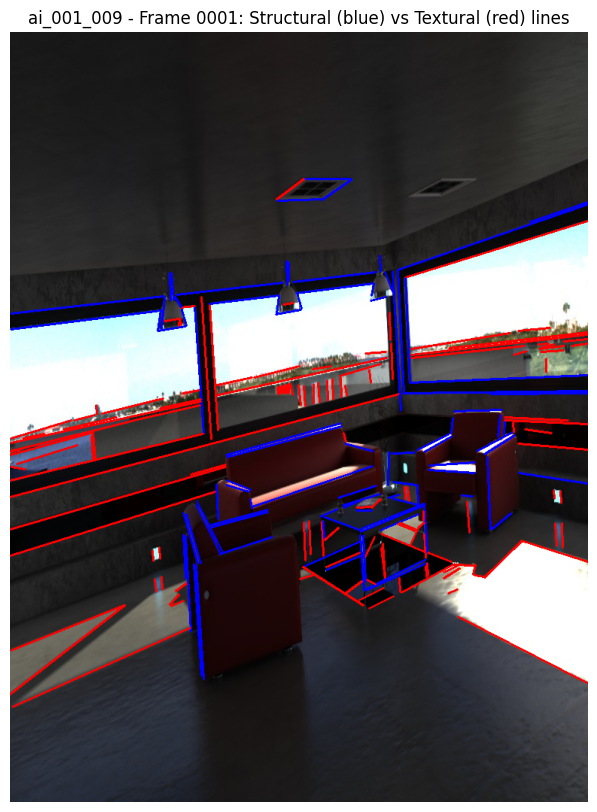


Processing image: ai_002_001 for frame 0001
data/ai_002_001/ai_002_001/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_002_001/ai_002_001/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_002_001/ai_002_001/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
Detected 545 lines; 179 classified as structural.
Saved composite image with structural/textural lines to data/ai_002_001/composite_lines_0001.png


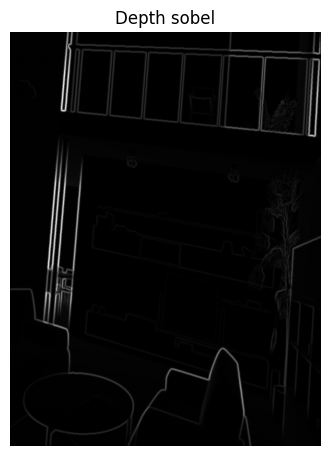

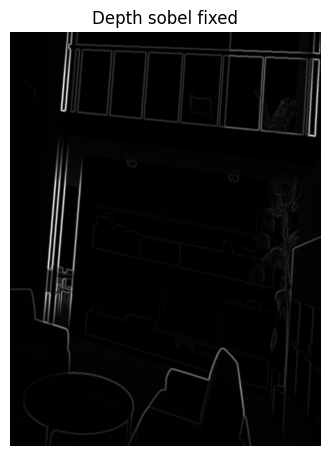

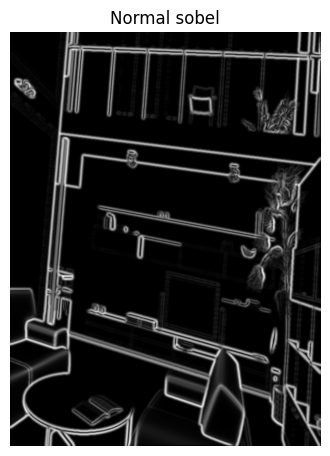

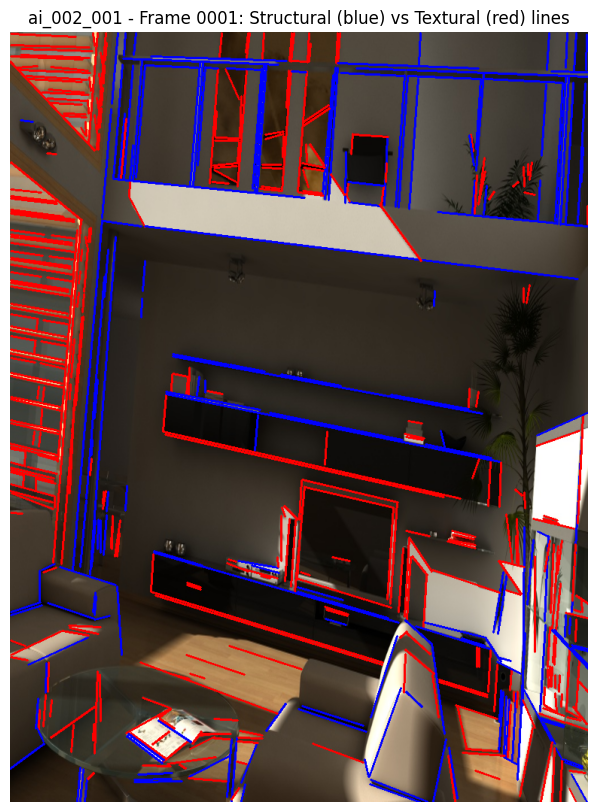


Processing image: ai_002_003 for frame 0001
data/ai_002_003/ai_002_003/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_002_003/ai_002_003/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_002_003/ai_002_003/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
Detected 796 lines; 282 classified as structural.
Saved composite image with structural/textural lines to data/ai_002_003/composite_lines_0001.png


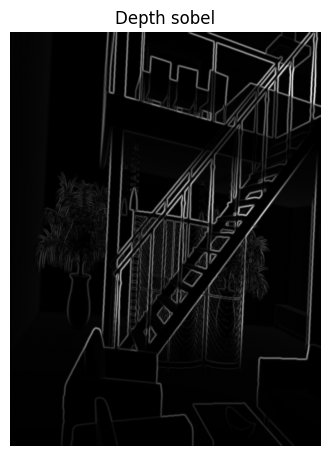

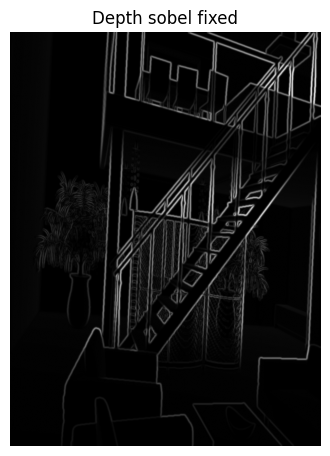

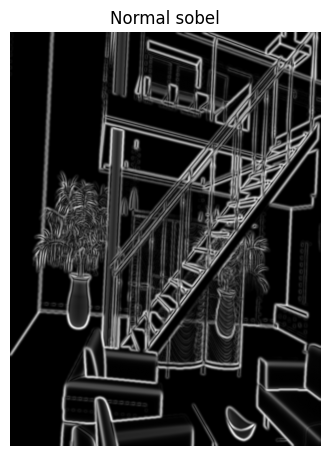

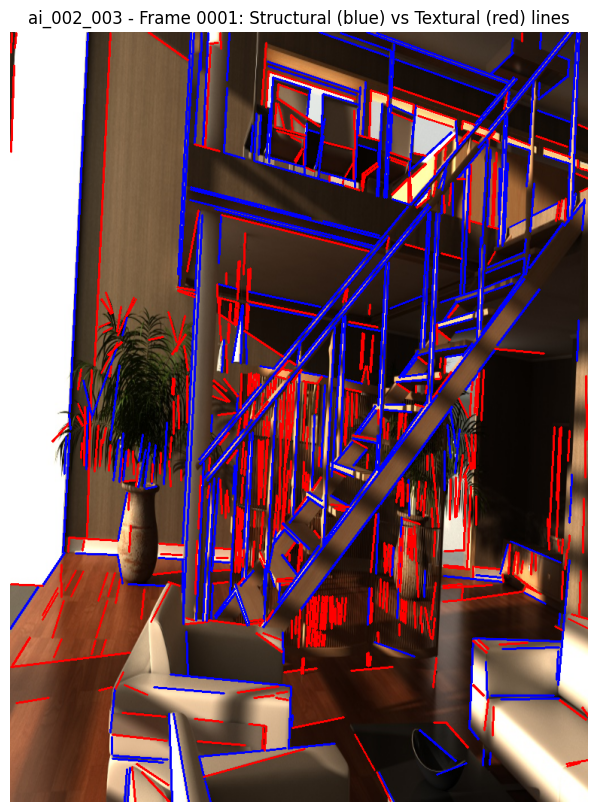


Processing image: ai_002_004 for frame 0001
data/ai_002_004/ai_002_004/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_002_004/ai_002_004/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_002_004/ai_002_004/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
Detected 775 lines; 191 classified as structural.
Saved composite image with structural/textural lines to data/ai_002_004/composite_lines_0001.png


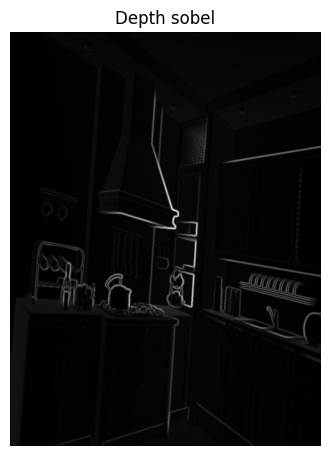

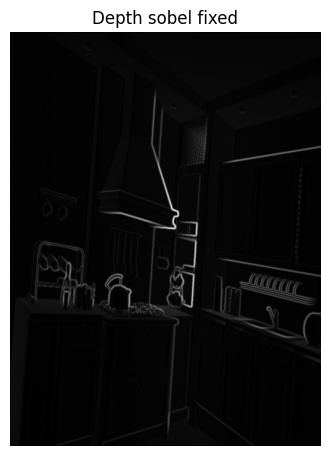

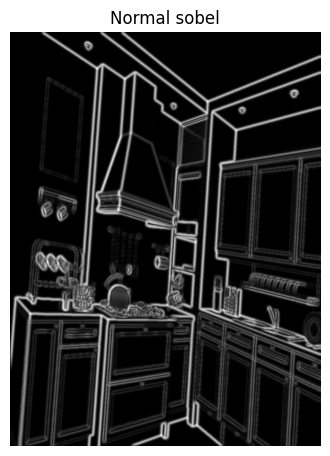

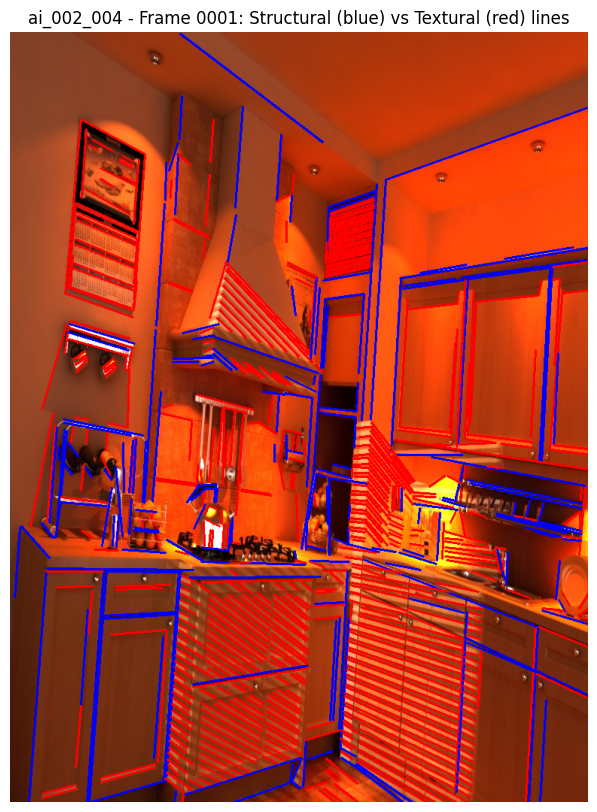


Processing image: ai_002_005 for frame 0001
data/ai_002_005/ai_002_005/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_002_005/ai_002_005/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_002_005/ai_002_005/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
Detected 539 lines; 197 classified as structural.
Saved composite image with structural/textural lines to data/ai_002_005/composite_lines_0001.png


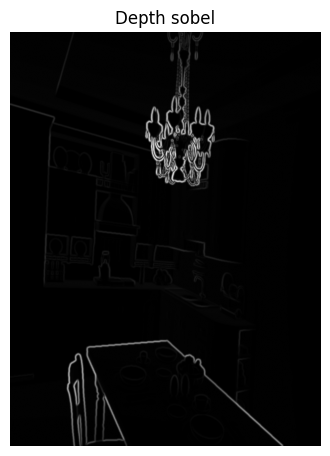

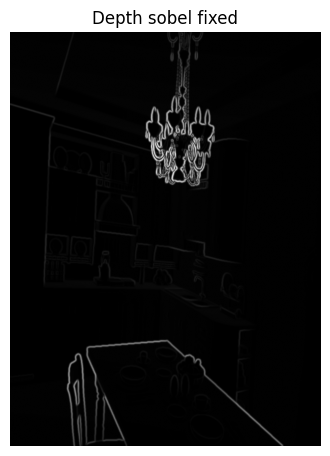

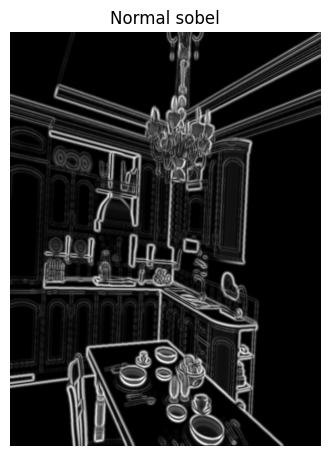

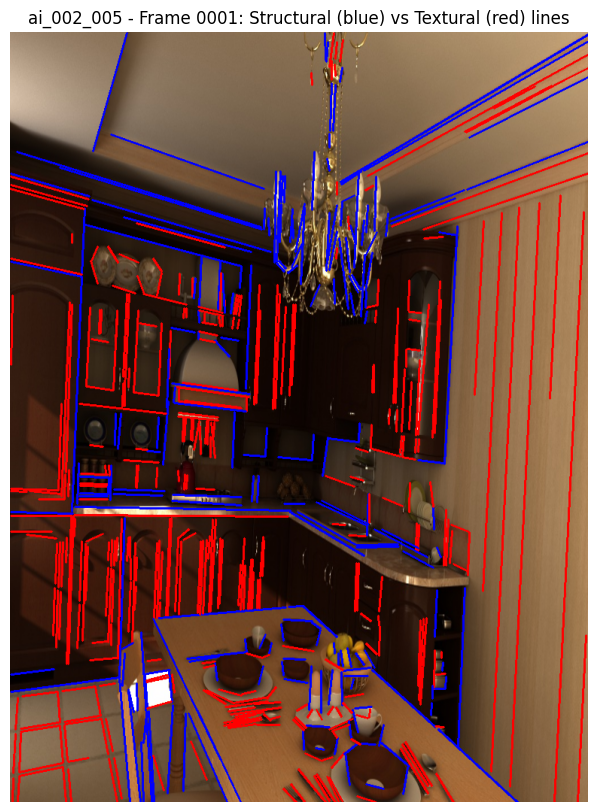


Processing image: ai_002_006 for frame 0001
data/ai_002_006/ai_002_006/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_002_006/ai_002_006/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_002_006/ai_002_006/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
Detected 397 lines; 153 classified as structural.
Saved composite image with structural/textural lines to data/ai_002_006/composite_lines_0001.png


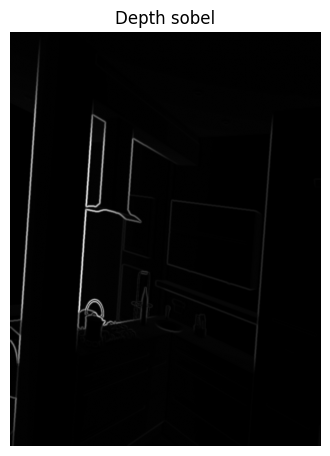

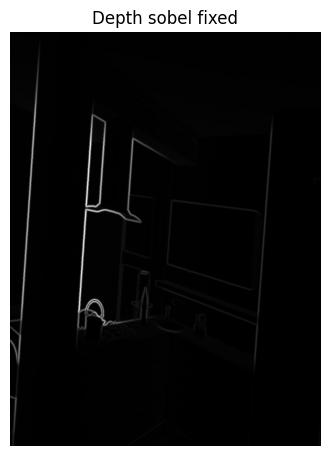

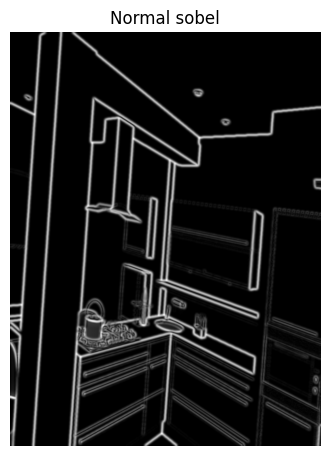

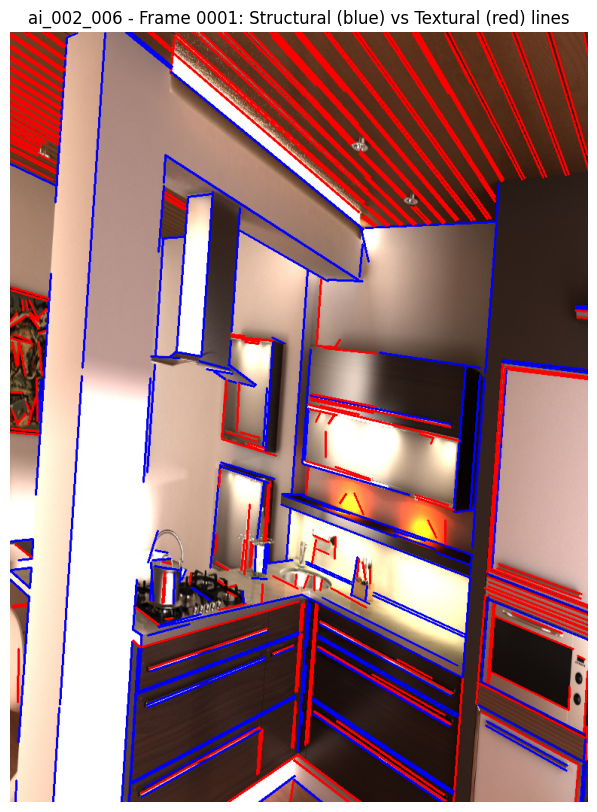

In [ ]:
# FIRST method

# Base folder where all downloaded image folders reside
base_data_dir = "data"
# List of downloaded image IDs (folder names)
image_ids = desired_images

for image_id in image_ids:
    image_dir = os.path.join(base_data_dir, image_id)
    print(f"\nProcessing image: {image_id} for frame {frame_str}")
    
    cam_view_color = "scene_cam_00_final_preview"
    cam_view_geom = "scene_cam_00_geometry_hdf5"

    color_img = load_color_image(image_dir, image_id, frame_str, cam_view_color)
    depth_map = load_depth_map(image_dir, image_id, frame_str, cam_view_geom)
    normal_map = load_normal_map(image_dir, image_id, frame_str, cam_view_geom)
    # default_h, default_w = 768, 1024
    # h, w = default_h, default_w 
    # color_img = load_color_image(image_dir, image_id, frame_str, cam_view_color)
    # color_img = cv2.resize(color_img, (h,w))
    
    h, w = color_img.shape[:2]

    fov_x = np.pi / 3  # set fov_x to pi/3 to match DIODE dataset (60 degrees)
    f = w / (2 * np.tan(fov_x / 2))
    fov_y = 2 * np.arctan(h / (2 * f))
    default_K = np.array([[f, 0, w / 2], [0, f, h / 2], [0, 0, 1]])
    R180x = np.array([[1, 0, 0], [0, -1, 0], [0, 0, -1]])


    depth_map = load_depth_map(image_dir, image_id, frame_str, cam_view_geom)
    # depth_map = cv2.resize(depth_map, (h,w))
    depth_map = raydepth2depth(depth_map, default_K)

    normal_map = load_normal_map(image_dir, image_id, frame_str, cam_view_geom)
    # normal_map = cv2.resize(normal_map, (h,w))
    
    if color_img is None or depth_map is None or normal_map is None:
        print("Missing data for", image_id, "; skipping.")
        continue
    
    gray_img = cv2.cvtColor(color_img, cv2.COLOR_RGB2GRAY)
    
    
    
    # Detect lines with DeepLSD
    input_tensor = torch.tensor(gray_img, dtype=torch.float32, device=device)[None, None] / 255.
    with torch.no_grad():
        out = net({'image': input_tensor})
        # Get predicted lines from the output. If they are torch.Tensor, convert to numpy.
        pred_lines = out['lines'][0]
        if isinstance(pred_lines, torch.Tensor):
            pred_lines = pred_lines.cpu().numpy()
    
    
    
    # Compute Sobel variation maps for depth and normal.
    sobel_depth_map = compute_variation(depth_map, 11)
    sobel_depth_map_fixed = compute_variation(depth_map, 11)
    sobel_normal_map = compute_variation(normal_map, 27)
    
    if len(sobel_normal_map.shape) == 3 and sobel_normal_map.shape[2] > 1:
        sobel_normal_map = np.sum(sobel_normal_map, axis=2)
    
    plot_images([sobel_depth_map], ["Depth sobel"], cmaps='gray')
    plot_images([sobel_depth_map_fixed], ["Depth sobel fixed"], cmaps='gray')
    plot_images([(sobel_normal_map)], ['Normal sobel'], cmaps='gray')



    
    
    # For each predicted line, compute variation along the line
    isdepth = []
    isnormal = []
    isstruct = []
    for l in pred_lines:
        ld, ln = sobel_line(sobel_depth_map_fixed, sobel_normal_map, l)
        depthbool = np.mean(ld) > 0.0001
        normalbool = np.mean(ln) > 0.0001
        isdepth.append(depthbool)
        isnormal.append(normalbool)
        isstruct.append(depthbool or normalbool)
    
    print(f"Detected {len(pred_lines)} lines; {sum(isstruct)} classified as structural.")
    
    
    
    
    # Overlay the lines on the original image.
    composite = overlay_lines_on_image(color_img, pred_lines, isstruct)
    
    # Save the composite image.
    out_path = os.path.join(image_dir, f"composite_lines_{frame_str}.png")
    composite_bgr = cv2.cvtColor(composite, cv2.COLOR_RGB2BGR)
    cv2.imwrite(out_path, composite_bgr)
    print(f"Saved composite image with structural/textural lines to {out_path}")
    
    # Display the composite image.
    plt.figure(figsize=(10, 10))
    plt.imshow(composite)
    plt.title(f"{image_id} - Frame {frame_str}: Structural (blue) vs Textural (red) lines")
    plt.axis('off')
    plt.show()

# Second method

# MAX of depth/normal + SUM of normal vector

In [ ]:

# MAX of depth/normal + SUM of normal vector


base_data_dir = "data"
image_ids = desired_images


# Define arrays for each parameter
depth_thresholds = [5]     
normal_thresholds = [6]      
thickness_values = [5]             


plot_process(image_ids, base_data_dir, depth_thresholds, normal_thresholds,
             thickness_values, n_columns=1, depth_normal_func=np.max, norm_agg_func=np.sum)
# For each image 



# MEAN of depth/normal + SUM of normal vector

In [ ]:
# MEAN of depth/normal + SUM of normal vector

depth_thresholds = [0.0001]     
normal_thresholds = [0.00005]    
thickness_values = [1]   

plot_process(image_ids, base_data_dir, depth_thresholds, normal_thresholds,
             thickness_values, n_columns=1, depth_normal_func=np.mean, depth_normal_func_str="Mean",
            norm_agg_func=np.sum)

# MEAN of depth/normal + NORM of normal vector

In [ ]:
# MEAN of depth/normal + NORM of normal vector
image_ids = desired_images

depth_thresholds = [0.0005]     
normal_thresholds = [0.0001]    
thickness_values = [1]   

plot_process(image_ids, base_data_dir, depth_thresholds, normal_thresholds,
             thickness_values, n_columns=1, depth_normal_func=np.mean, depth_normal_func_str="Mean",
            norm_agg_func=LA.norm)

# MAX of depth/normal + NORM of normal vector


[Parameter Comparison] Processing image: ai_001_001 for frame 0001
data/ai_001_001/ai_001_001/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_001/ai_001_001/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_001/ai_001_001/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
[Neighborhood Method] ai_001_001: Detected 398 lines; 159 classified as structural.


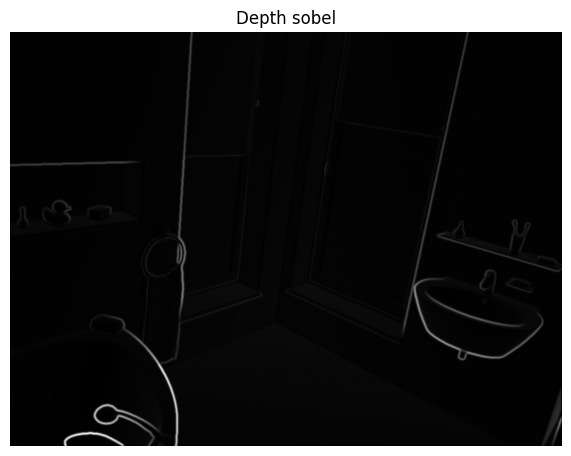

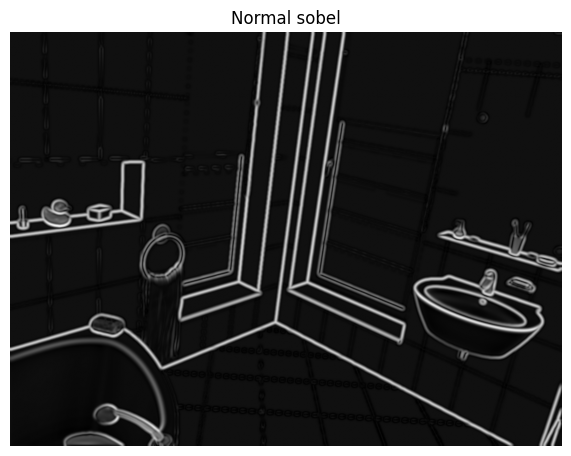

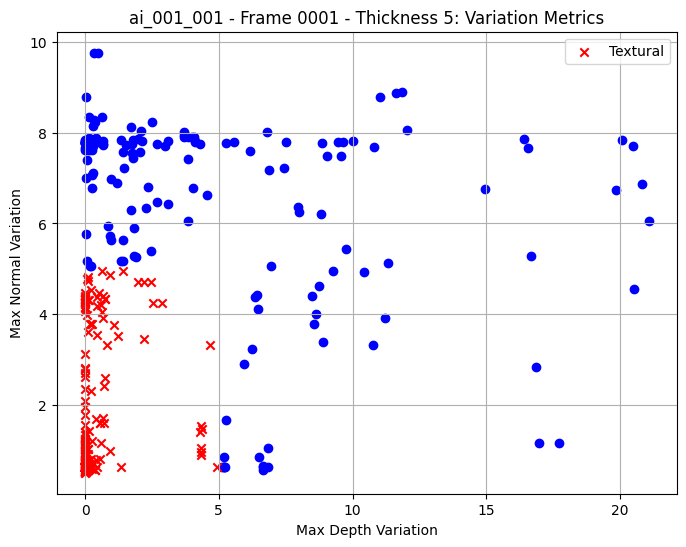

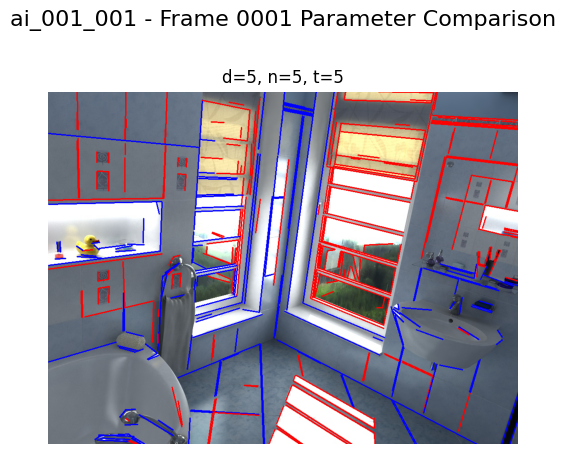

Saved parameter comparison grid to data/ai_001_001/parameter_comparison_0001.png

[Parameter Comparison] Processing image: ai_001_003 for frame 0001
data/ai_001_003/ai_001_003/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_003/ai_001_003/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_003/ai_001_003/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
[Neighborhood Method] ai_001_003: Detected 375 lines; 0 classified as structural.


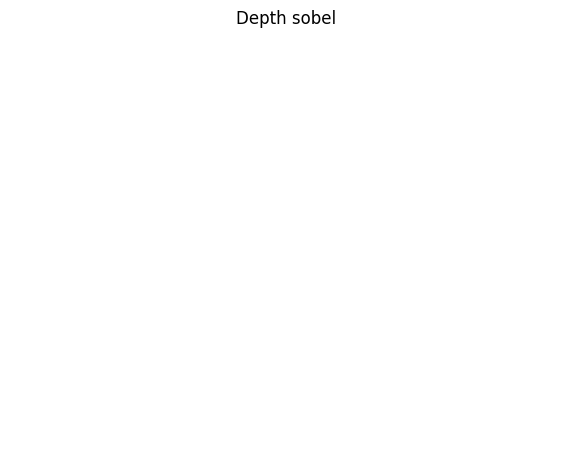

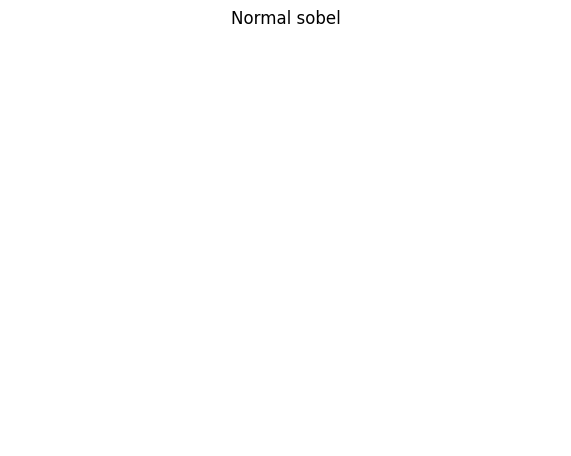

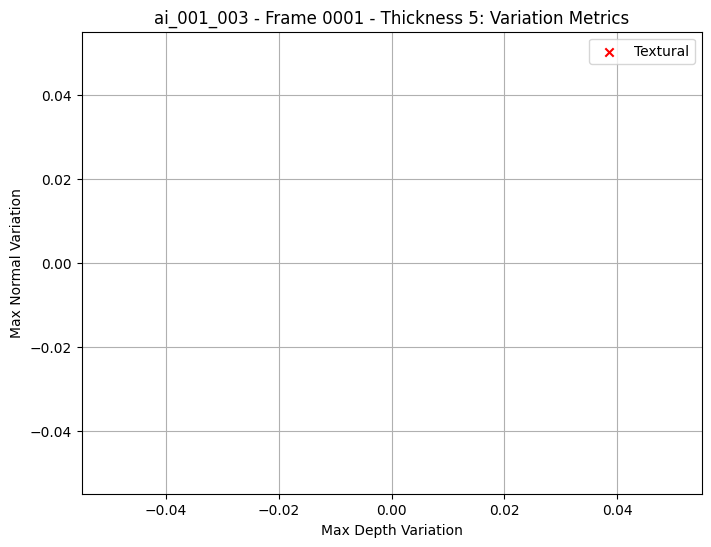

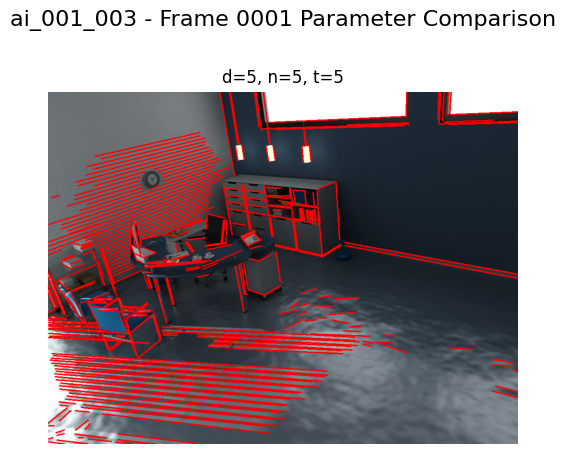

Saved parameter comparison grid to data/ai_001_003/parameter_comparison_0001.png

[Parameter Comparison] Processing image: ai_001_004 for frame 0001
data/ai_001_004/ai_001_004/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_004/ai_001_004/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_004/ai_001_004/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
[Neighborhood Method] ai_001_004: Detected 377 lines; 155 classified as structural.


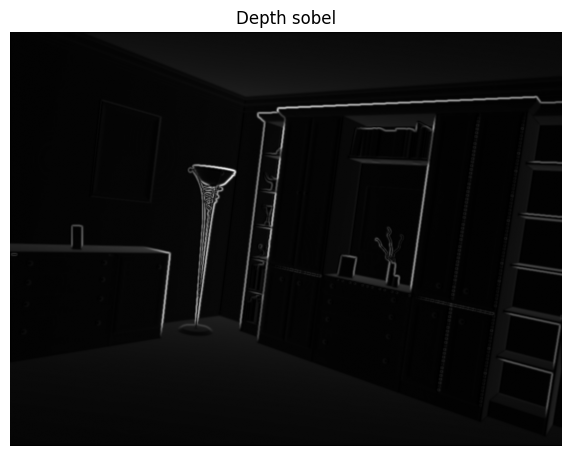

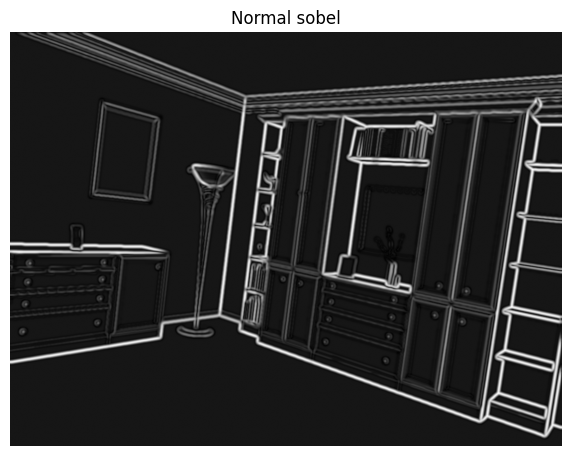

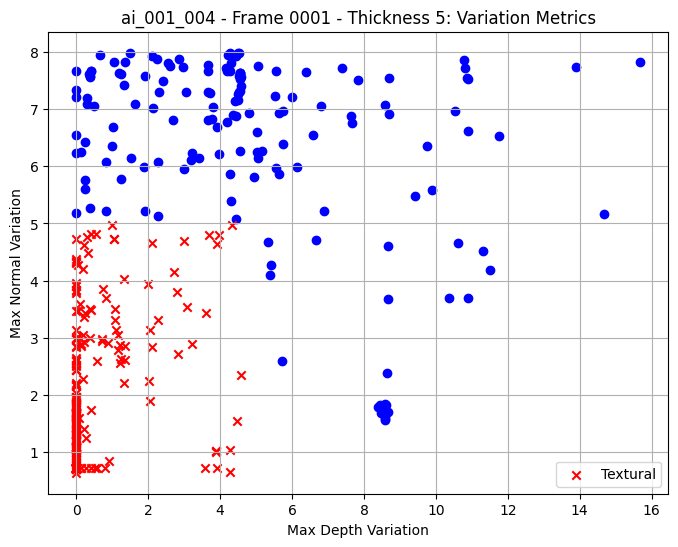

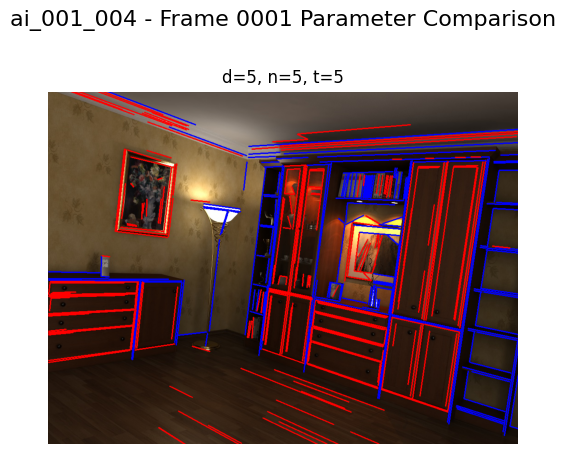

Saved parameter comparison grid to data/ai_001_004/parameter_comparison_0001.png

[Parameter Comparison] Processing image: ai_001_005 for frame 0001
data/ai_001_005/ai_001_005/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_005/ai_001_005/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_005/ai_001_005/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
[Neighborhood Method] ai_001_005: Detected 459 lines; 302 classified as structural.


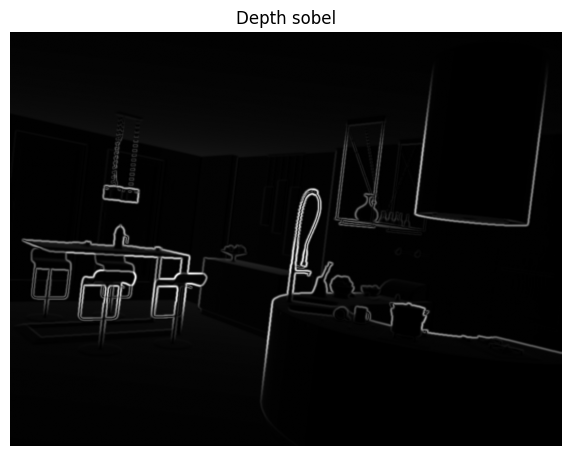

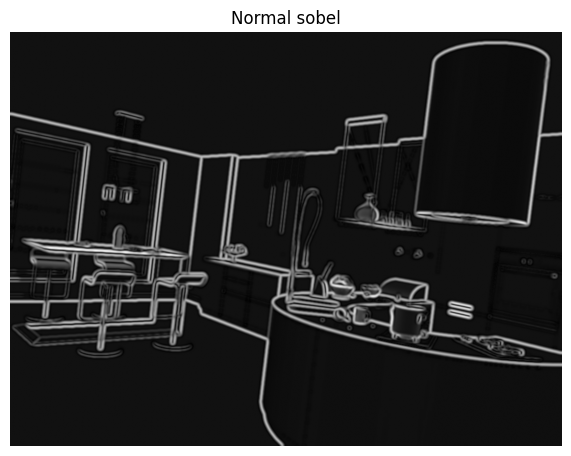

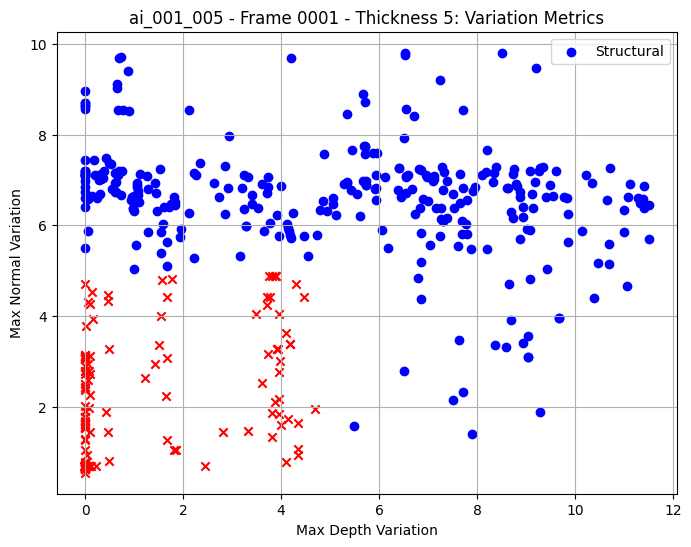

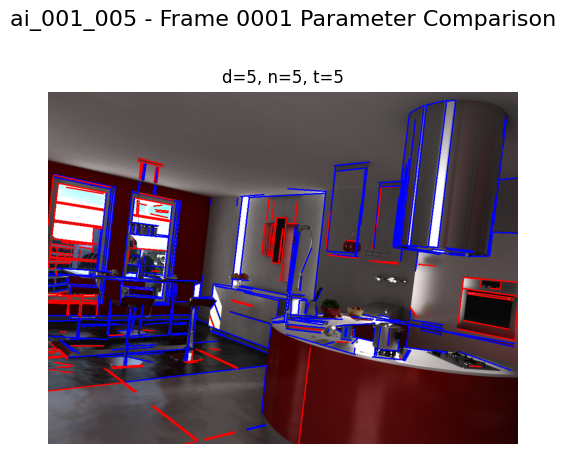

Saved parameter comparison grid to data/ai_001_005/parameter_comparison_0001.png

[Parameter Comparison] Processing image: ai_001_006 for frame 0001
data/ai_001_006/ai_001_006/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_006/ai_001_006/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_006/ai_001_006/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
[Neighborhood Method] ai_001_006: Detected 481 lines; 135 classified as structural.


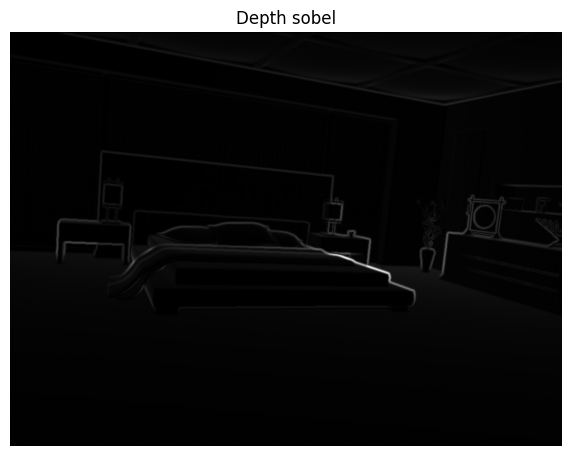

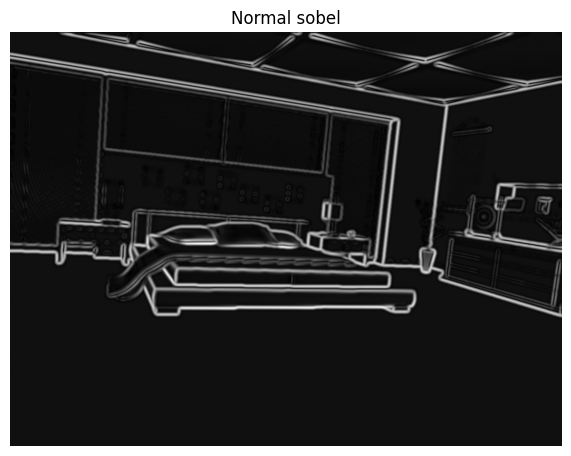

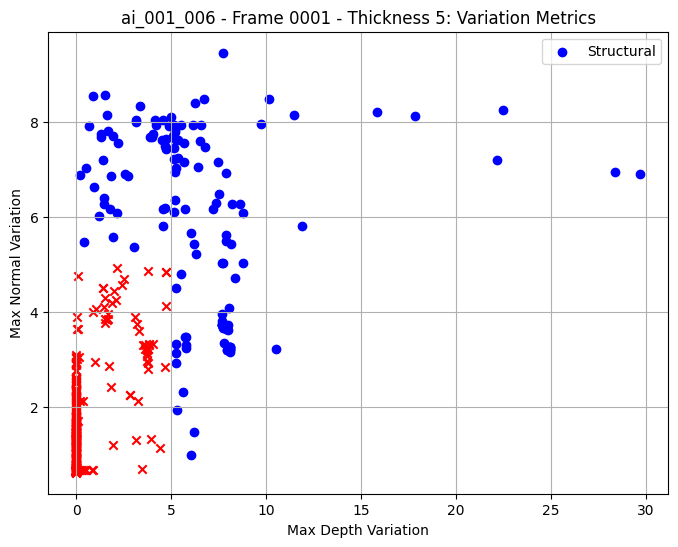

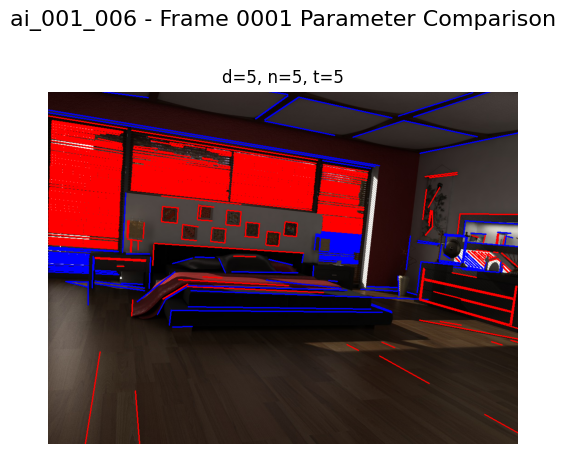

Saved parameter comparison grid to data/ai_001_006/parameter_comparison_0001.png

[Parameter Comparison] Processing image: ai_001_007 for frame 0001
data/ai_001_007/ai_001_007/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_007/ai_001_007/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_007/ai_001_007/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
[Neighborhood Method] ai_001_007: Detected 493 lines; 171 classified as structural.


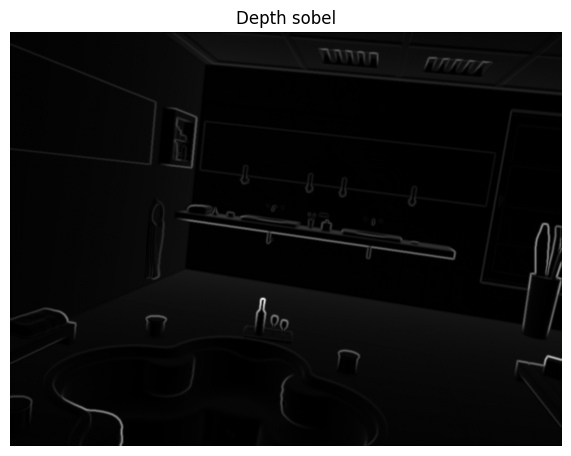

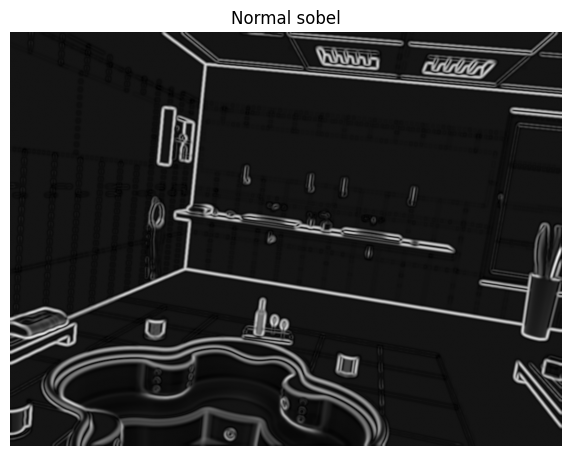

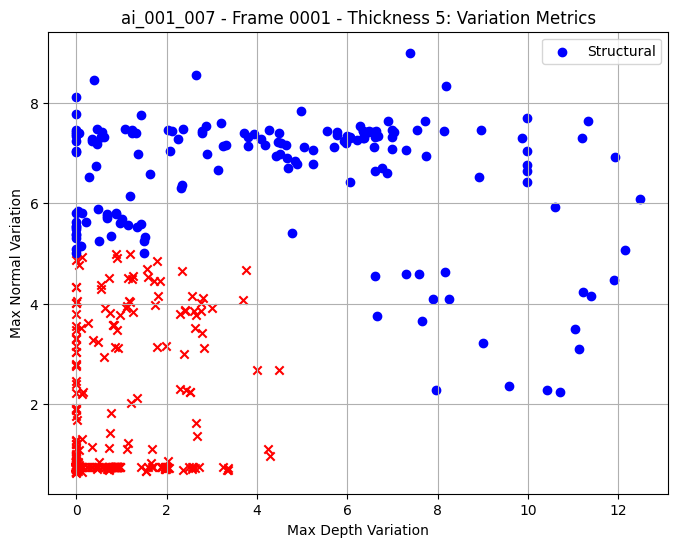

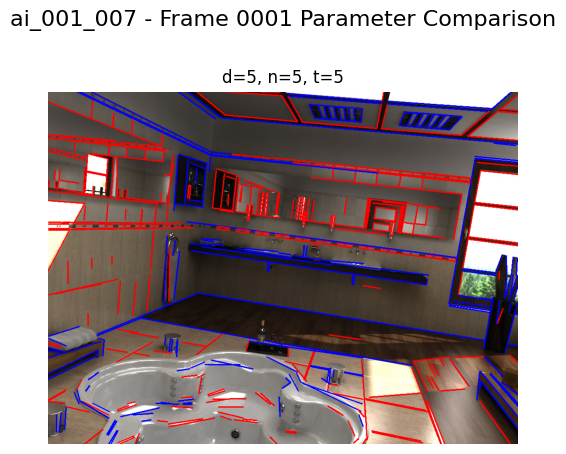

Saved parameter comparison grid to data/ai_001_007/parameter_comparison_0001.png

[Parameter Comparison] Processing image: ai_001_008 for frame 0001
data/ai_001_008/ai_001_008/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_008/ai_001_008/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_008/ai_001_008/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
[Neighborhood Method] ai_001_008: Detected 439 lines; 157 classified as structural.


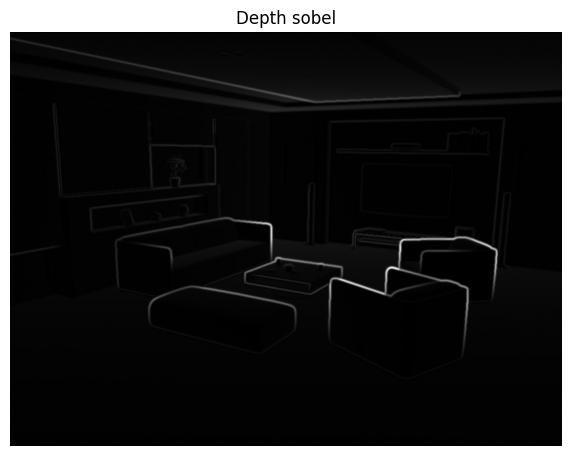

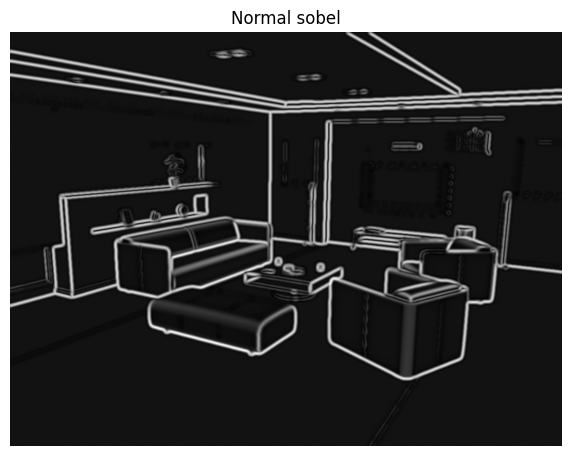

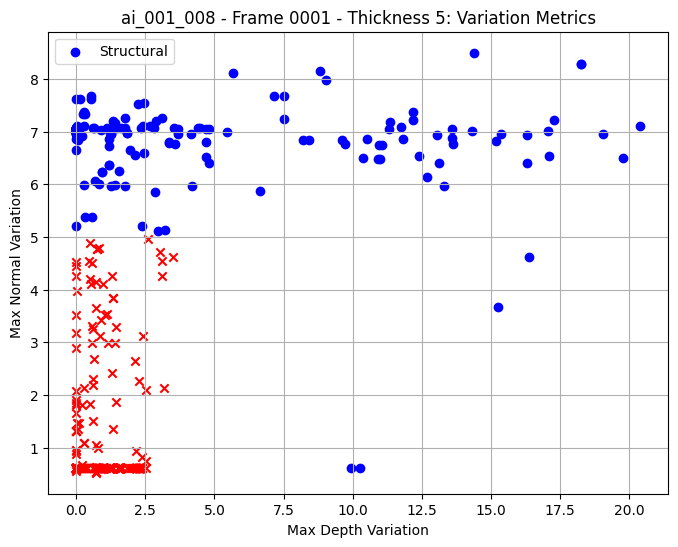

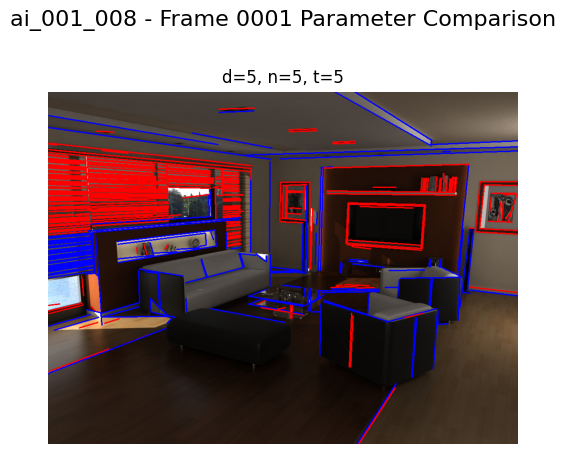

Saved parameter comparison grid to data/ai_001_008/parameter_comparison_0001.png

[Parameter Comparison] Processing image: ai_001_009 for frame 0001
data/ai_001_009/ai_001_009/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_001_009/ai_001_009/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_001_009/ai_001_009/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
[Neighborhood Method] ai_001_009: Detected 188 lines; 109 classified as structural.


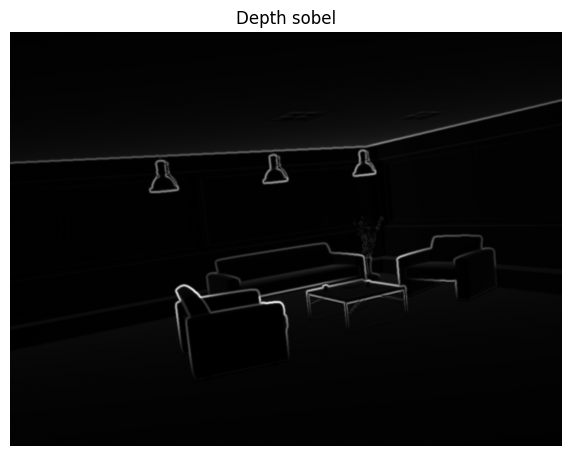

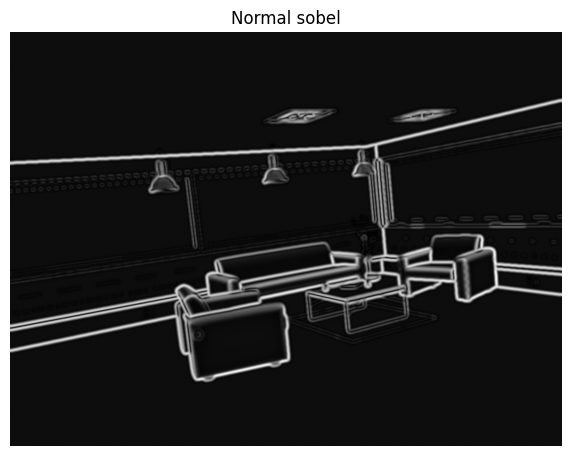

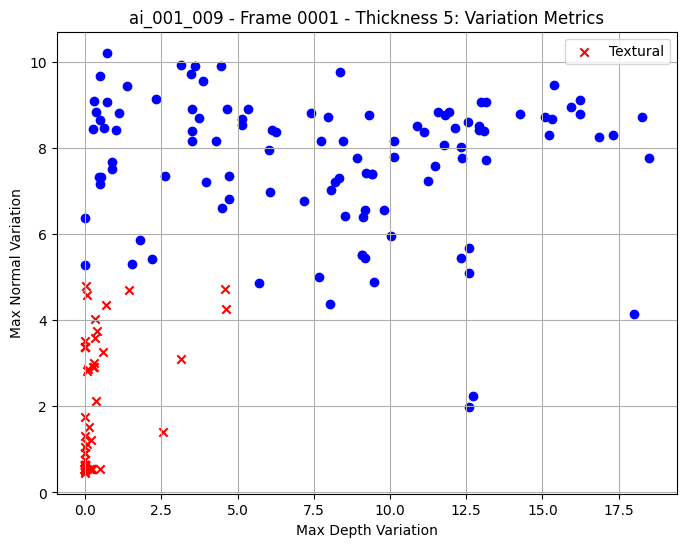

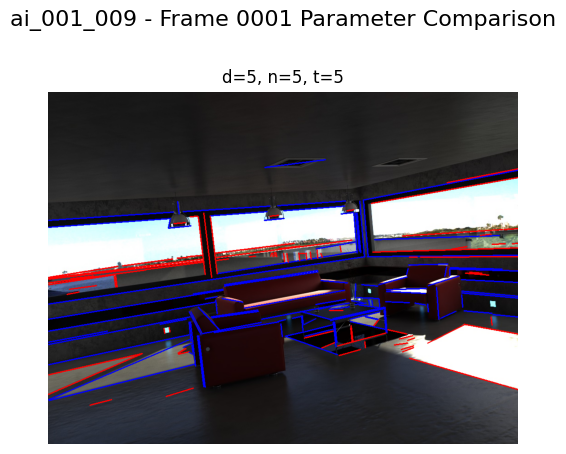

Saved parameter comparison grid to data/ai_001_009/parameter_comparison_0001.png

[Parameter Comparison] Processing image: ai_002_001 for frame 0001
data/ai_002_001/ai_002_001/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_002_001/ai_002_001/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_002_001/ai_002_001/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
[Neighborhood Method] ai_002_001: Detected 499 lines; 225 classified as structural.


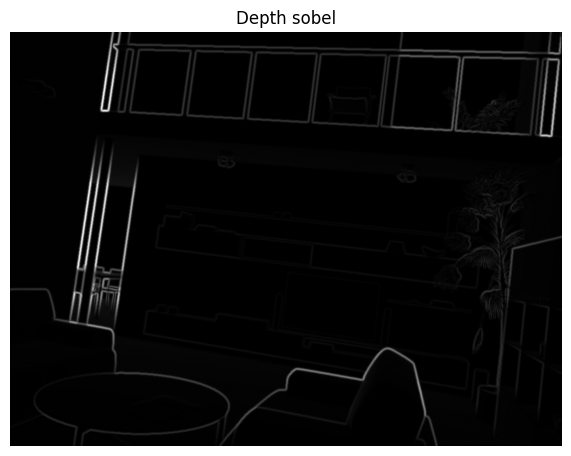

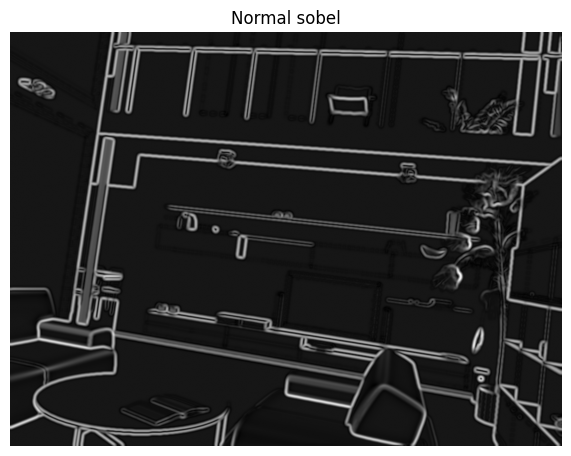

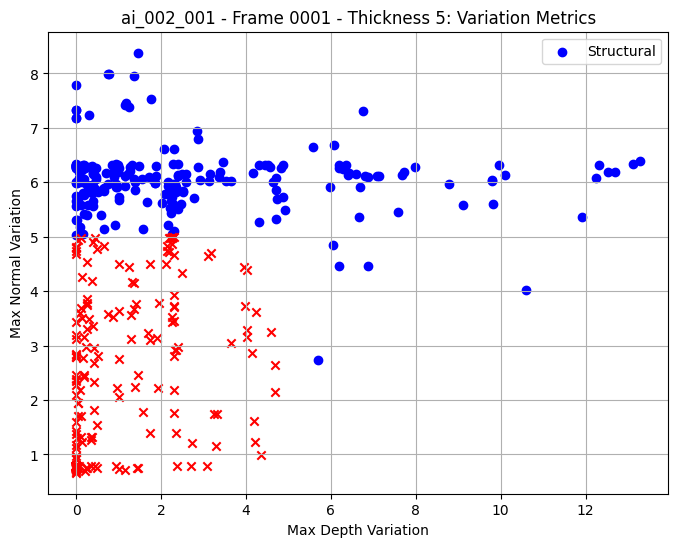

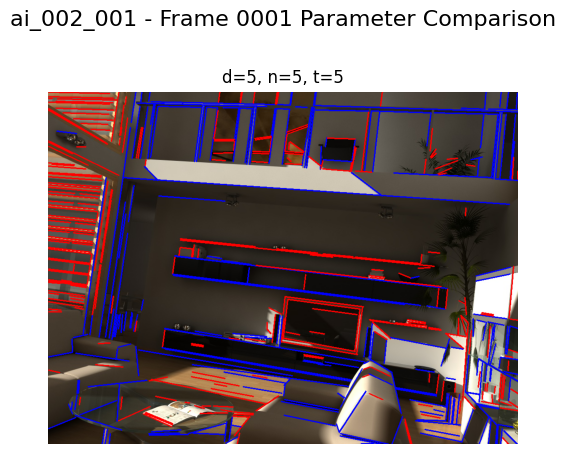

Saved parameter comparison grid to data/ai_002_001/parameter_comparison_0001.png

[Parameter Comparison] Processing image: ai_002_003 for frame 0001
data/ai_002_003/ai_002_003/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_002_003/ai_002_003/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_002_003/ai_002_003/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
[Neighborhood Method] ai_002_003: Detected 893 lines; 319 classified as structural.


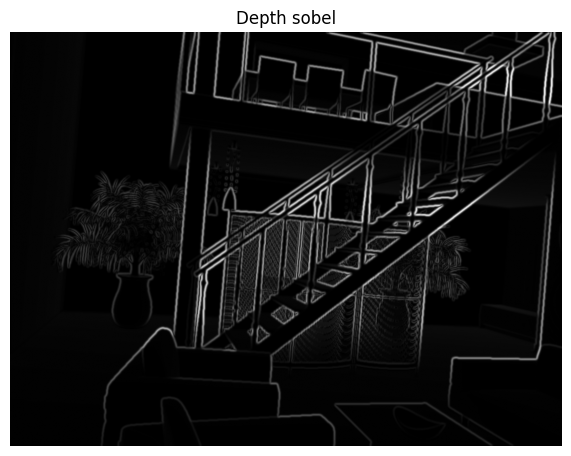

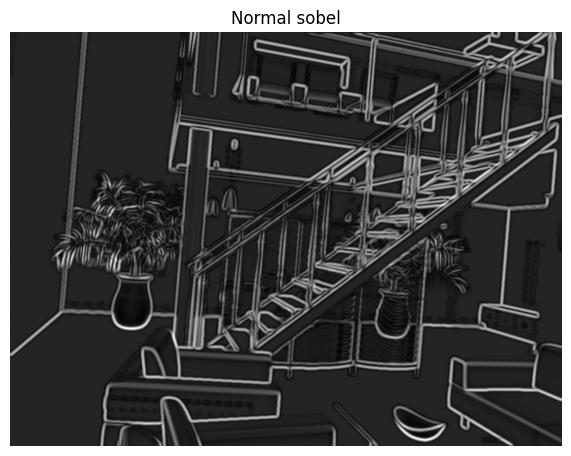

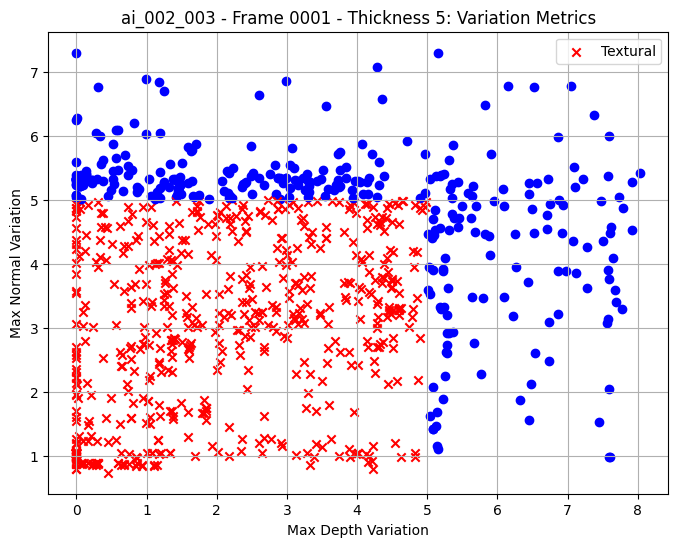

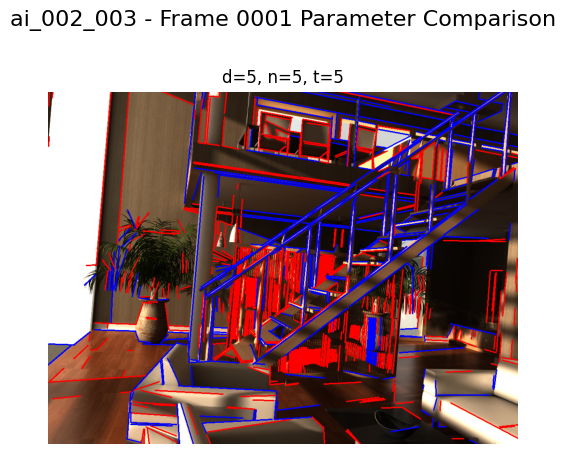

Saved parameter comparison grid to data/ai_002_003/parameter_comparison_0001.png

[Parameter Comparison] Processing image: ai_002_004 for frame 0001
data/ai_002_004/ai_002_004/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_002_004/ai_002_004/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_002_004/ai_002_004/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
[Neighborhood Method] ai_002_004: Detected 758 lines; 322 classified as structural.


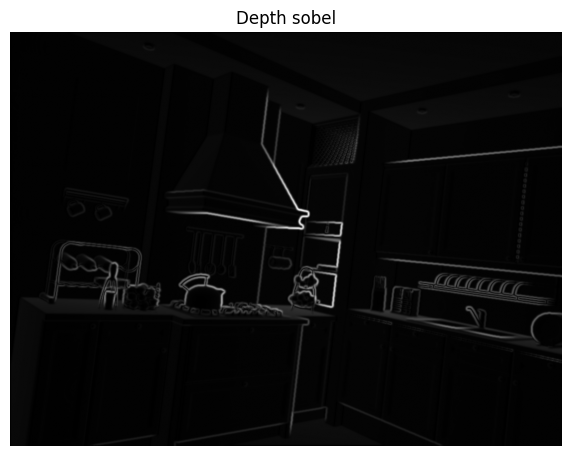

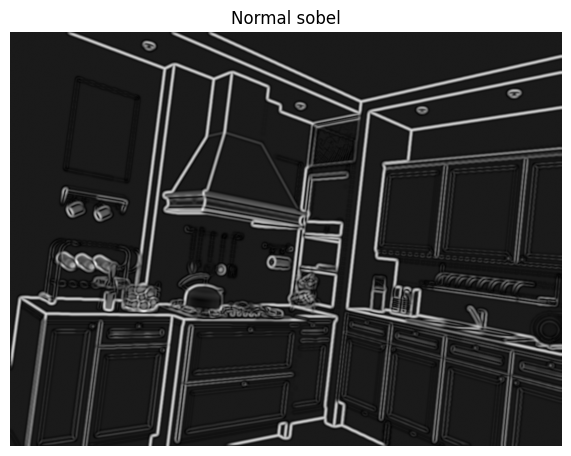

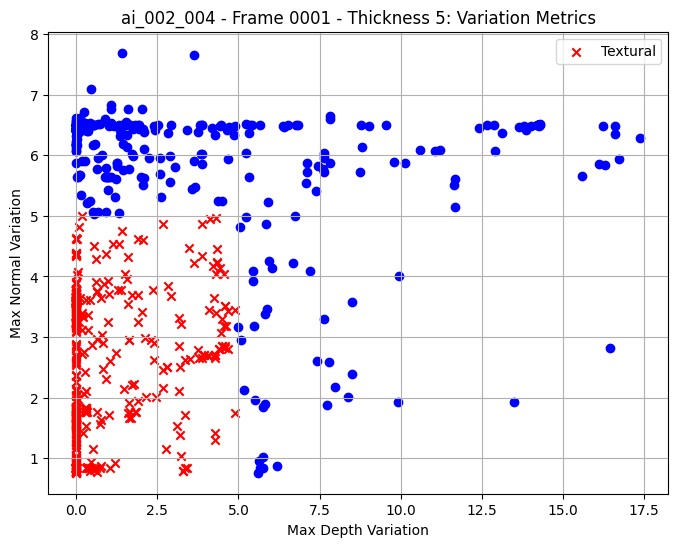

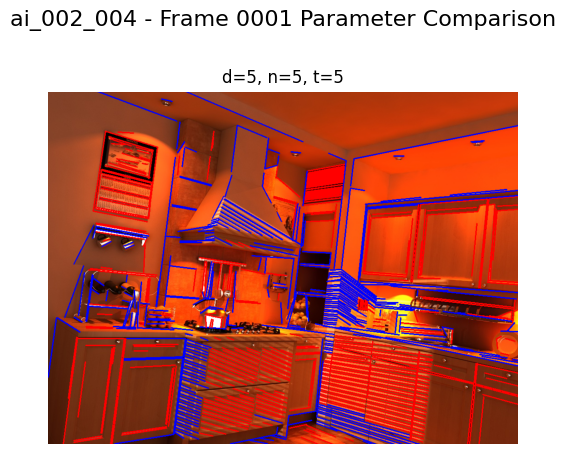

Saved parameter comparison grid to data/ai_002_004/parameter_comparison_0001.png

[Parameter Comparison] Processing image: ai_002_005 for frame 0001
data/ai_002_005/ai_002_005/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_002_005/ai_002_005/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_002_005/ai_002_005/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
[Neighborhood Method] ai_002_005: Detected 498 lines; 237 classified as structural.


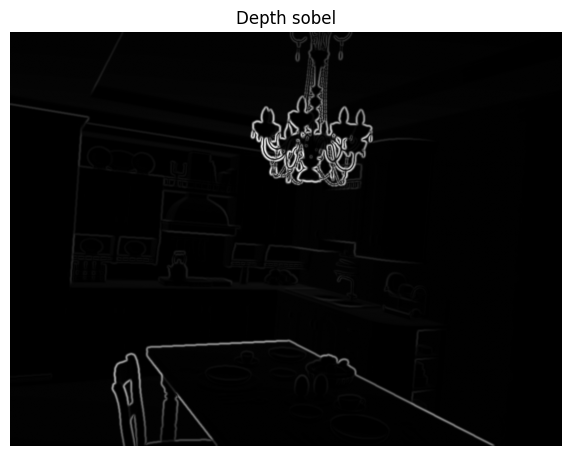

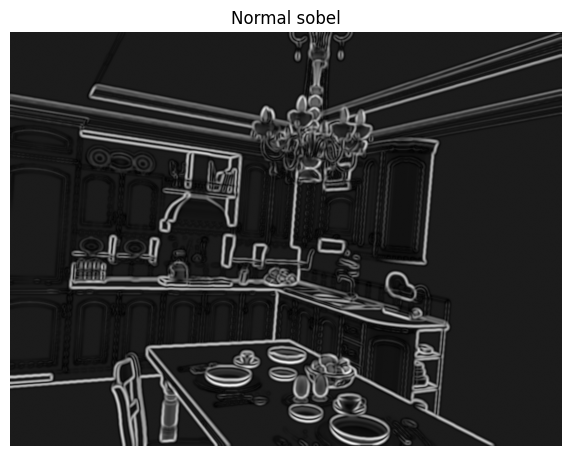

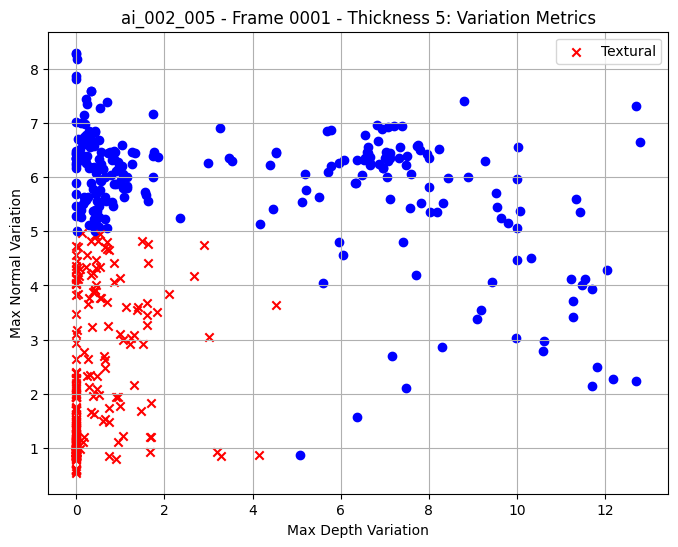

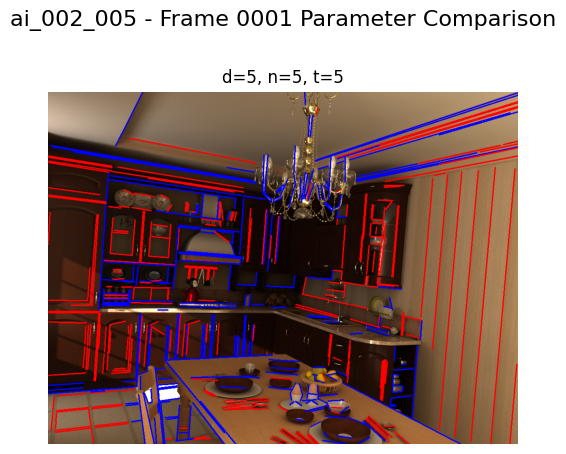

Saved parameter comparison grid to data/ai_002_005/parameter_comparison_0001.png

[Parameter Comparison] Processing image: ai_002_006 for frame 0001
data/ai_002_006/ai_002_006/images/scene_cam_00_final_preview/frame.0001.color.jpg
data/ai_002_006/ai_002_006/images/scene_cam_00_geometry_hdf5/frame.0001.depth_meters.hdf5
data/ai_002_006/ai_002_006/images/scene_cam_00_geometry_hdf5/frame.0001.normal_world.hdf5
[Neighborhood Method] ai_002_006: Detected 394 lines; 230 classified as structural.


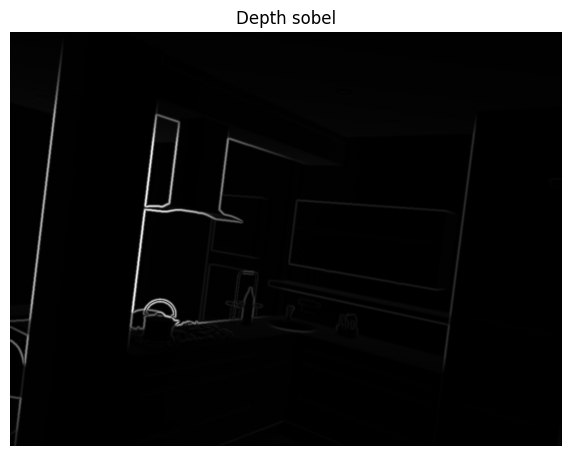

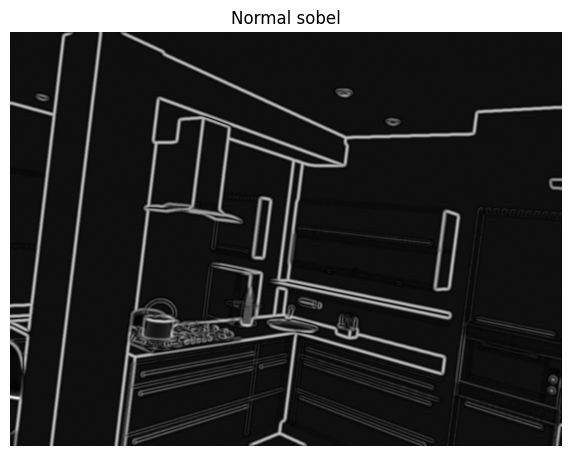

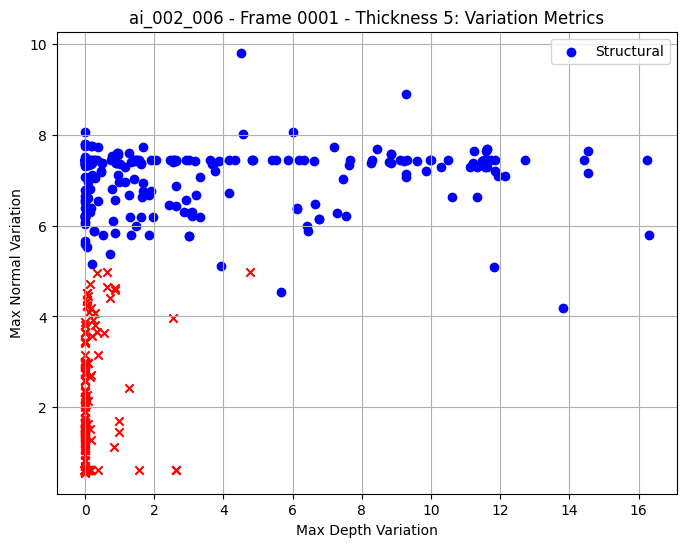

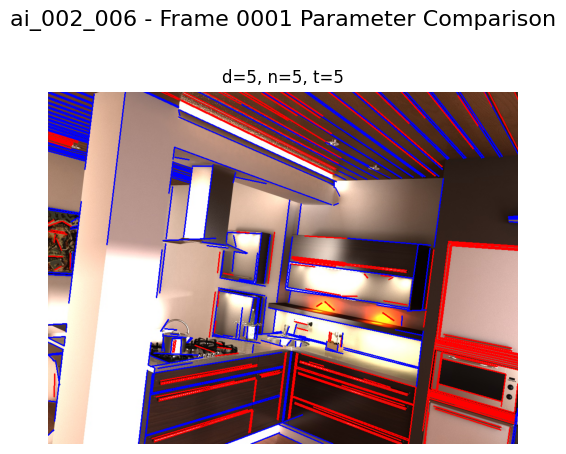

Saved parameter comparison grid to data/ai_002_006/parameter_comparison_0001.png


In [34]:
# MEAN of depth/normal + NORM of normal vector
image_ids = desired_images

depth_thresholds = [5]     
normal_thresholds = [5]    
thickness_values = [5]   

plot_process(image_ids, base_data_dir, depth_thresholds, normal_thresholds,
             thickness_values, n_columns=1, depth_normal_func=np.max, depth_normal_func_str="Max",
            norm_agg_func=LA.norm)
